# Imports and Definitions

In [1]:
import os
import json

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import pytorch_lightning as pl
from collections import defaultdict, OrderedDict
from torch.nn import functional as F
from torch.utils.data import DataLoader, random_split, Dataset
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import models
from torchvision.models import resnet18, ResNet18_Weights
from torchvision import datasets
from torchvision import transforms as T
from torchvision.transforms import v2 as transforms_v2
from torchvision.transforms import InterpolationMode
from torchinfo import summary
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import LearningRateMonitor, BatchSizeFinder, ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
import glob
import ttach as tta

## CassavaDataset

In [2]:
# 7 minibatches per batch due to: 
# [60, 45, 30, 15, 3, 1, 0]

In [3]:
class CassavaDataset(Dataset):
    def __init__(self, csv_file, images_dir, label_map_file, set_name=None, transform=None, num_subsets=1, subset_idx=None):
        self.df = pd.read_csv(csv_file)
        
        # Filtrar por set_name si se proporciona
        if set_name:
            self.df = self.df[self.df['set'] == set_name].reset_index(drop=True)
            if set_name == 'train':
                class_3 = self.df[self.df['label'] == 3].sample(n=2000, random_state=42)
            elif set_name == 'val':
                class_3 = self.df[self.df['label'] == 3].sample(n=400, random_state=42)
            else:
                class_3 = self.df[self.df['label'] == 3]
            
            other_classes = self.df[self.df['label'] != 3]
            self.df = pd.concat([class_3, other_classes]).reset_index(drop=True)
        
        # Set seed if required
        if num_subsets > 1 and subset_idx is not None:
            # Random permutation (set seed for reproducibility)
            np.random.seed(42)
            shuffled_indices = np.random.permutation(len(self.df))
            
            # Divide the subset in num_subsets splits
            subset_splits = np.array_split(shuffled_indices, num_subsets)
            
            # Select the desired subset
            selected_indices = subset_splits[subset_idx % num_subsets]
            self.df = self.df.iloc[selected_indices].reset_index(drop=True)
        
        self.images_dir = images_dir
        self.transform = transform
        
        # Load label mapping
        with open(label_map_file, 'r') as f:
            self.label_map = json.load(f)
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        # Get info from CSV
        row = self.df.iloc[idx]
        img_name = row['image_id']
        label = row['label']
        
        # Load img
        img_path = os.path.join(self.images_dir, f'{img_name}')
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

## DataModule

In [27]:
class DataModule(pl.LightningDataModule):
    def __init__(self, data_dir='cassava', batch_size=64, num_workers=2, num_subsets=7, transforms=transforms):
        super().__init__()
        self.save_hyperparameters()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.num_subsets = num_subsets
        self.subset_idx = 0
        self.transforms = transforms
        
    def setup(self, stage=None):
        images_dir = os.path.join(self.data_dir, 'images')
        
        # Rutas a los archivos
        csv_file = os.path.join(self.data_dir, 'cassava_split.csv')
        label_map_file = os.path.join(self.data_dir, 'label_num_to_disease_map.json')
        
        # Preparar transforms
        #transform = ResNet18_Weights.IMAGENET1K_V1.transforms()
        
        # Crear datasets con el subset_idx ACTUAL
        self.train_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='train',
            num_subsets=self.num_subsets,
            subset_idx=self.subset_idx,
            transform=self.transforms['train']
        )
        
        self.val_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='val',
            num_subsets=1, #self.num_subsets,
            subset_idx=0, #self.subset_idx,
            transform=self.transforms['val']
        )
        
        self.test_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='test',
            num_subsets=1,
            subset_idx=0,
            transform=self.transforms['test']
        )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers,
            shuffle=True
        )
    
    def val_dataloader(self):
        return DataLoader(
            self.val_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )

## LightningModule

In [4]:
class LightningModule(pl.LightningModule):
    def __init__(self, model, lr=1e-3, wd=0.):
        super().__init__()
        self.model = model
        self.lr = lr
        self.wd = wd

        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)

    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        
        # Configure ReduceLROnPlateau scheduler
        scheduler = ReduceLROnPlateau(
            optimizer,
            mode='min',           # Minimize the monitored metric
            factor=0.1,          # Multiply LR by this factor when reducing
            patience=5,          # Number of epochs with no improvement before reducing LR
            threshold=0.01,      # Threshold for measuring improvement
            threshold_mode='rel', # 'rel' for relative change, 'abs' for absolute
            cooldown=0,          # Number of epochs to wait before resuming normal operation
            min_lr=1e-6,         # Lower bound on the learning rate
            eps=1e-8             # Minimal decay applied to lr
        )
        
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'val_loss',  # Metric to monitor
                'interval': 'epoch',     # Update scheduler after each epoch
                'frequency': 1,          # Check metric every epoch
                'strict': True,          # Enforce that monitored metric exists
            }
        }

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        self.log('train_loss', loss, on_step=False, on_epoch=True)
        
        self.training_step_outputs['loss'] += loss.detach().cpu()
        self.training_step_outputs['steps'] += 1
            
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = F.cross_entropy(logits, y)
        self.log('val_loss', loss, on_step=False, on_epoch=True)

        self.validation_step_outputs['loss'] += loss.detach().cpu()
        self.validation_step_outputs['steps'] += 1
        
        return loss

    def on_train_epoch_end(self): 
        avg_loss = self.training_step_outputs['loss'] / self.training_step_outputs['steps']
        print(f"Average training loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.training_step_outputs.clear() 

    def on_validation_epoch_end(self):
        avg_loss = self.validation_step_outputs['loss'] / self.validation_step_outputs['steps']
        print(f"Average validation loss for epoch {self.current_epoch}: {avg_loss.item():.4f}")
        self.validation_step_outputs.clear()

## Useful functions

### EDA functions

In [29]:
def plot_class_distribution(csv_file_path, set_name, filename=None):
    """
    Create a fancy barplot showing class distribution for cassava disease dataset.
    
    Parameters:
    -----------
    csv_file_path : str
        Path to the cassava_split.csv file
    set_name : str
        Dataset split to visualize ('train', 'val', or 'test')
    filename : str, optional
        If provided, saves the plot to this filename
    """
    # Load the CSV file
    df = pd.read_csv(csv_file_path)
    
    # Filter by set
    df_filtered = df[df['set'] == set_name]
    
    # Load label mapping
    label_map_path = csv_file_path.replace('cassava_split.csv', 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)
    
    # Count classes
    class_counts = df_filtered['label'].value_counts().sort_index()
    
    # Map labels to disease names
    labels = [label_map[str(i)] for i in class_counts.index]
    counts = class_counts.values
    
    # Calculate percentages
    total = counts.sum()
    percentages = (counts / total) * 100
    
    # Create figure with custom style
    plt.figure(figsize=(12, 7))
    sns.set_style("whitegrid")
    
    # Create color palette
    colors = sns.color_palette("husl", len(labels))
    
    # Create bars
    bars = plt.bar(range(len(labels)), counts, color=colors, edgecolor='black', linewidth=1.5, alpha=0.8)
    
    # Add value labels on bars
    for i, (bar, count, pct) in enumerate(zip(bars, counts, percentages)):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{count}\n({pct:.1f}%)',
                ha='center', va='bottom', fontsize=11, fontweight='bold')
    
    # Customize plot
    plt.xlabel('Disease Class', fontsize=14, fontweight='bold')
    plt.ylabel('Number of Images', fontsize=14, fontweight='bold')
    plt.title(f'Cassava Disease Class Distribution - {set_name.capitalize()} Set', 
              fontsize=16, fontweight='bold', pad=20)
    
    # Set x-axis labels
    plt.xticks(range(len(labels)), labels, rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=11)
    
    # Add grid for better readability
    plt.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add total count in the corner
    plt.text(0.98, 0.98, f'Total: {total} images', 
             transform=plt.gca().transAxes,
             fontsize=12, fontweight='bold',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5),
             verticalalignment='top', horizontalalignment='right')
    
    plt.tight_layout()
    
    # Save if filename provided
    if filename:
        plt.savefig(filename, dpi=80)
    
    plt.show()

In [30]:
def plot_random_samples(csv_file_path, set_name, samples_per_class=3, figsize=(15, 10), seed=42, filename=None):
    """
    Plot random samples from each class in a fancy grid layout.
    
    Parameters:
    -----------
    csv_file_path : str
        Path to the cassava_split.csv file
    set_name : str
        Dataset split to visualize ('train', 'val', or 'test')
    samples_per_class : int, default=3
        Number of random samples to show per class
    figsize : tuple, default=(15, 10)
        Figure size (width, height)
    seed : int, default=42
        Random seed for reproducibility
    """
    # Set random seed
    np.random.seed(seed)
    
    # Load the CSV file
    df = pd.read_csv(csv_file_path)
    
    # Filter by set
    df_filtered = df[df['set'] == set_name].reset_index(drop=True)
    
    # Load label mapping
    base_path = os.path.dirname(csv_file_path)
    label_map_path = os.path.join(base_path, 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)
    
    # Get images folder path
    images_path = os.path.join(base_path, 'images')
    
    # Get unique classes
    classes = sorted(df_filtered['label'].unique())
    n_classes = len(classes)
    
    # Create figure with subplots
    fig, axes = plt.subplots(n_classes, samples_per_class, figsize=figsize)
    
    # Handle case of single row
    if n_classes == 1:
        axes = axes.reshape(1, -1)
    
    # Color palette for borders
    colors = plt.cm.Set3(np.linspace(0, 1, n_classes))
    
    # Plot samples for each class
    for class_idx, label in enumerate(classes):
        # Get all images for this class
        class_images = df_filtered[df_filtered['label'] == label]['image_id'].values
        
        # Randomly sample
        if len(class_images) >= samples_per_class:
            sampled_images = np.random.choice(class_images, samples_per_class, replace=False)
        else:
            sampled_images = class_images
        
        # Plot each sample
        for sample_idx, img_id in enumerate(sampled_images):
            ax = axes[class_idx, sample_idx]
            
            # Load and display image
            img_path = os.path.join(images_path, img_id)
            try:
                img = Image.open(img_path)
                ax.imshow(img)
            except Exception as e:
                ax.text(0.5, 0.5, f'Error loading\n{img_id}', 
                       ha='center', va='center', fontsize=8)
            
            # Remove ticks
            ax.set_xticks([])
            ax.set_yticks([])
            
            # Add colored border
            for spine in ax.spines.values():
                spine.set_edgecolor(colors[class_idx])
                spine.set_linewidth(3)
            
            # Add title only for first column
            if sample_idx == 0:
                disease_name = label_map[str(label)]
                # Extract abbreviation from parenthesis or use full name for Healthy
                if 'Healthy' in disease_name:
                    abbrev = 'Healthy'
                else:
                    abbrev = disease_name[disease_name.find('(')+1:disease_name.find(')')]
                ax.set_ylabel(abbrev, fontsize=11, fontweight='bold', 
                            rotation=90, labelpad=10)
            
            # Add image filename at the bottom
            img_abbrev = img_id.split('.')[0][:10]
            ax.set_xlabel(img_abbrev, fontsize=8, style='italic')
    
    # Add main title
    fig.suptitle(f'Random Samples from Cassava Disease Dataset - {set_name.capitalize()} Set', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # Add legend for classes
    legend_labels = []
    for label in classes:
        disease_name = label_map[str(label)]
        if 'Healthy' in disease_name:
            legend_labels.append('Healthy')
        else:
            legend_labels.append(disease_name[disease_name.find('(')+1:disease_name.find(')')])
    
    legend_elements = [plt.Rectangle((0, 0), 1, 1, fc=colors[i], edgecolor='black', linewidth=1.5, label=legend_labels[i]) 
                      for i, label in enumerate(classes)]
    fig.legend(handles=legend_elements, loc='lower center', ncol=n_classes, 
              bbox_to_anchor=(0.5, -0.02), fontsize=10, frameon=True, fancybox=True, shadow=True)
    
    plt.tight_layout()
    # Save if filename provided
    if filename:
        plt.savefig(filename, dpi=80)
    plt.show()

In [31]:
def compute_mean_images_per_class(csv_file_path, set_name, batch_size=32, channels=None):
    """
    Compute mean image per class using batch processing.
    
    Parameters:
    -----------
    csv_file_path : str
        Path to the cassava_split.csv file
    set_name : str
        Dataset split to process ('train', 'val', or 'test')
    batch_size : int, default=32
        Number of images to process per batch
    channels : list of int, optional
        List of channel indices to use (0=R, 1=G, 2=B).
        If None, uses all channels [0, 1, 2].
        Examples: [0, 1, 2] for RGB, [1] for G only, [0, 2] for R and B
    
    Returns:
    --------
    dict
        Dictionary with class labels as keys and normalized mean images as values
    """
    # Default to all RGB channels if not specified
    if channels is None:
        channels = [0, 1, 2]
    # Load the CSV file
    df = pd.read_csv(csv_file_path)
    
    # Filter by set
    df_filtered = df[df['set'] == set_name].reset_index(drop=True)
    
    # Get base path and images folder
    base_path = os.path.dirname(csv_file_path)
    images_path = os.path.join(base_path, 'images')
    
    # Get unique classes
    classes = sorted(df_filtered['label'].unique())
    result = {}
    
    print(f"Computing mean images for {len(classes)} classes...")
    
    for cls in classes:
        print(f"  Processing class {cls}...", end=" ")
        
        # Get all images for this class
        subset = df_filtered[df_filtered['label'] == cls]
        count = 0
        mean_acc = None
        
        # Process in batches
        for batch_start in range(0, len(subset), batch_size):
            batch_end = min(batch_start + batch_size, len(subset))
            batch_rows = subset.iloc[batch_start:batch_end]
            
            imgs = []
            for _, row in batch_rows.iterrows():
                img_path = os.path.join(images_path, row['image_id'])
                try:
                    img = Image.open(img_path).convert("RGB")
                    img_array = np.array(img, dtype=np.float32)
                    # Select only specified channels
                    img_array = img_array[:, :, channels]
                    imgs.append(img_array)
                except Exception as e:
                    continue
            
            if imgs:
                # Stack images and compute batch mean
                imgs_stack = np.stack(imgs, axis=0)
                batch_mean = np.mean(imgs_stack, axis=0)
                
                # Update accumulated mean
                if mean_acc is None:
                    mean_acc = batch_mean
                else:
                    # Weighted average: (old_mean * old_count + batch_mean * batch_count) / total_count
                    aux1 = mean_acc * count
                    aux2 = batch_mean * len(imgs)
                    mean_acc = (aux1 + aux2) / (count + len(imgs))
                
                count += len(imgs)
        
        if mean_acc is not None:
            # Normalize to [0, 1]
            result[cls] = mean_acc / 255.0
            print(f"{count} images processed")
        else:
            print("No valid images found")
    
    return result


def plot_mean_images_per_class(csv_file_path, set_name, batch_size=32, 
                                channels=None, cache_file=None, filename=None):
    """
    Compute or load and plot mean images per class.
    
    Parameters:
    -----------
    csv_file_path : str
        Path to the cassava_split.csv file
    set_name : str
        Dataset split to process ('train', 'val', or 'test')
    batch_size : int, default=32
        Number of images to process per batch
    channels : list of int, optional
        List of channel indices to use (0=R, 1=G, 2=B).
        If None, uses all channels [0, 1, 2].
        Examples: [0, 1, 2] for RGB, [1] for G only, [0, 2] for R and B
    cache_file : str, optional
        Path to .npy file for caching mean images
    filename : str, optional
        If provided, saves the plot to this filename
    
    Returns:
    --------
    matplotlib.figure.Figure
        The generated figure object
    """
    # Default to all RGB channels if not specified
    if channels is None:
        channels = [0, 1, 2]
    mean_images = None
    
    # Try to load from cache
    if cache_file and os.path.exists(cache_file):
        try:
            print(f"[INFO] Loading mean images from {cache_file}")
            mean_images = np.load(cache_file, allow_pickle=True).item()
        except Exception as e:
            print(f"[WARN] Could not load mean images from {cache_file}: {e}")
    
    # Compute if not loaded
    if mean_images is None:
        print("[INFO] Computing mean images...")
        mean_images = compute_mean_images_per_class(csv_file_path, set_name, batch_size, channels)
        
        # Save to cache
        if cache_file:
            np.save(cache_file, mean_images)
            print(f"[INFO] Saved mean images to {cache_file}")
    
    # Load label mapping
    base_path = os.path.dirname(csv_file_path)
    label_map_path = os.path.join(base_path, 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)
    
    # Plot
    n_classes = len(mean_images)
    cols = min(3, n_classes)
    rows = int(np.ceil(n_classes / cols))
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    
    # Handle single subplot case
    if n_classes == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    # Color palette for borders
    colors = plt.cm.Set3(np.linspace(0, 1, n_classes))
    
    for i, (cls, img) in enumerate(sorted(mean_images.items())):
        ax = axes[i]
        
        # Prepare image for display based on number of channels
        if img.shape[2] == 1:
            # Single channel - display as grayscale
            display_img = np.clip(img[:, :, 0], 0, 1)
            ax.imshow(display_img, cmap='gray')
        elif img.shape[2] == 2:
            # Two channels - create RGB image with zeros for missing channel
            display_img = np.zeros((img.shape[0], img.shape[1], 3))
            if channels == [0, 1]:  # R and G
                display_img[:, :, 0] = img[:, :, 0]
                display_img[:, :, 1] = img[:, :, 1]
            elif channels == [0, 2]:  # R and B
                display_img[:, :, 0] = img[:, :, 0]
                display_img[:, :, 2] = img[:, :, 1]
            elif channels == [1, 2]:  # G and B
                display_img[:, :, 1] = img[:, :, 0]
                display_img[:, :, 2] = img[:, :, 1]
            ax.imshow(np.clip(display_img, 0, 1))
        else:
            # Three channels - display as RGB
            ax.imshow(np.clip(img, 0, 1))
        
        # Get class name abbreviation
        disease_name = label_map[str(cls)]
        if 'Healthy' in disease_name:
            abbrev = 'Healthy'
        else:
            abbrev = disease_name[disease_name.find('(')+1:disease_name.find(')')]
        
        # Create channel description
        channel_names = {0: 'R', 1: 'G', 2: 'B'}
        channel_desc = ''.join([channel_names[ch] for ch in channels])
        
        # Style
        ax.set_title(f'Mean Prototype: {abbrev} ({channel_desc})', 
                    fontsize=14, fontweight='bold', pad=10)
        ax.axis('off')
        
        # Add colored border
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(colors[i])
            spine.set_linewidth(4)
    
    # Hide unused subplots
    for j in range(n_classes, len(axes)):
        axes[j].axis('off')
    
    # Add main title
    channel_names = {0: 'R', 1: 'G', 2: 'B'}
    channel_desc = ''.join([channel_names[ch] for ch in channels])
    fig.suptitle(f'Mean Image Prototypes per Class ({channel_desc}) - {set_name.capitalize()} Set', 
                 fontsize=16, fontweight='bold', y=0.98)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Save if filename provided
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"[INFO] Plot saved to {filename}")
    
    plt.show()

### Performance functions

In [5]:
def plot_cm(trainer, data_module, filename=None):
    """
    Plot confusion matrix from trained model predictions.
    
    Parameters:
    -----------
    trainer : pytorch_lightning.Trainer
        The trained PyTorch Lightning trainer object
    data_module : pytorch_lightning.LightningDataModule
        The data module containing test data
    filename : str, optional
        If provided, saves the plot to this filename
    """
    # Extract the model from the trainer
    model = trainer.lightning_module

    label_map_path = os.path.join(DATASET_PATH, 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)

    class_labels = []
    for label in range(len(label_map)):
        disease_name = label_map[str(label)]
        # Extract abbreviation from parenthesis or use full name for Healthy
        if 'Healthy' in disease_name:
            abbrev = 'Healthy'
        else:
            abbrev = disease_name[disease_name.find('(')+1:disease_name.find(')')]
        class_labels.append(abbrev)

    # Use GPU if available and set model to evaluation mode
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()

    y_trues = []
    y_hats = []

    # Iterate through the dataloader and collect predictions and true labels
    print("Generating predictions...")
    for x, y_true in data_module.test_dataloader():
        x = x.to(device)
        with torch.no_grad():
            logits = model(x)
            # Apply softmax and take argmax to get predicted class indices
            preds = logits.softmax(dim=1).argmax(dim=1).cpu()

        y_hats.append(preds)
        # Ensure true labels are on CPU before concatenation
        y_trues.append(y_true.cpu())

    # Concatenate and convert to numpy arrays for sklearn and matplotlib
    y_trues = torch.cat(y_trues).numpy()
    y_hats = torch.cat(y_hats).numpy()

    # Calculate F1 score (use 'macro' for multiclass)
    f1 = f1_score(y_trues, y_hats, average='macro')
    print(f'F1 Score (macro): {f1:.4f}')

    # Build confusion matrix
    num_classes = len(class_labels)
    labels = np.arange(num_classes)
    cm = confusion_matrix(y_trues, y_hats, labels=labels)

    # Normalize by row (true label) to get per-class percentages
    with np.errstate(all='ignore'):
        row_sums = cm.sum(axis=1, keepdims=True)
        cm_row_norm = np.divide(cm.astype(float), row_sums, where=row_sums != 0)
        cm_row_norm = np.nan_to_num(cm_row_norm)  # replace NaN/inf with 0 for empty rows

    # Create annotations that include both count and percentage
    nrows, ncols = cm.shape
    annot = np.empty((nrows, ncols), dtype=object)
    for i in range(nrows):
        for j in range(ncols):
            annot[i, j] = f"{cm[i, j]}\n{cm_row_norm[i, j]*100:.2f}%"

    # Plot: normalized confusion matrix with count + percentage per cell
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_row_norm, annot=annot, fmt='', cmap='Blues', cbar=True,
                xticklabels=class_labels, yticklabels=class_labels,
                cbar_kws={'label': 'Normalized value'})
    
    plt.title(f"Confusion Matrix (F1 Score Macro: {f1:.4f})", fontsize=14, fontweight='bold', pad=15)
    plt.xlabel("Predicted Labels", fontsize=12, fontweight='bold')
    plt.ylabel("True Labels", fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    
    if filename is not None:
        plt.savefig(filename, dpi=80)
        print(f"Confusion matrix saved to {filename}")
    
    plt.show()

In [6]:
def plot_loss_curves(trainer, filename=None):

    sns.set_style(style='ticks')
    metric_df = pd.read_csv(f'{trainer.logger.log_dir}/metrics.csv')
    metric_df = metric_df.groupby('epoch', as_index=False).first()
    f, ax = plt.subplots(1, 1, figsize=(10, 5))
    metric_df.train_loss.plot(ax=ax, label='train')
    metric_df.val_loss.plot(ax=ax, label='val')
    
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('Training vs Validation Loss')
    
    # Set x-axis ticks to show every epoch
    epochs = metric_df['epoch'].dropna().astype(int)
    ax.set_xticks(epochs)
    ax.set_xticklabels(epochs)
    
    # Rotate labels if there are many epochs
    if len(epochs) > 20:
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
    ax.legend()
    
    if filename is not None:
        os.makedirs(os.path.dirname(filename), exist_ok=True)
        plt.savefig(filename, dpi=80)
    plt.show()

# EDA

## Dataset download

In [7]:
DATASET_PATH = os.path.join(os.getcwd(), 'cassava')
IMG_DIR_PATH = os.path.join(DATASET_PATH, 'images')
NUM_CLASSES = 5

In [12]:
if not os.path.exists(IMG_DIR_PATH):

    # Download from Huggingface
    !wget -q --show-progress https://huggingface.co/datasets/cayala/cassava/resolve/main/cassava.zip
    
    # Extract to folder
    !unzip -q cassava.zip
    
    !unzip -q ./cassava/images.zip -d ./cassava/images/
    !rm ./cassava/images.zip
    
    # Remove the zip file
    !rm cassava.zip

## Image Sizes Analysis

In [ ]:
widths, heights = [], []

for img_file in tqdm(os.listdir(IMG_DIR_PATH)):
    try:
        with Image.open(os.path.join(IMG_DIR_PATH, img_file)) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)
    except Exception:
        print(f'Error ocurred on image {img_file}')

print("Image sizes:")
print(f"Min width: {np.min(widths)}")
print(f"Max width: {np.max(widths)}")
print(f"Min height: {np.min(heights)}")
print(f"Max height: {np.max(heights)}")

100%|████████████████████████████████████| 21397/21397 [03:04<00:00, 115.82it/s]

Image sizes:
Min width: 800
Max width: 800
Min height: 600
Max height: 600


Good. All images are of the same size. That will make things easier.

## Class Distribution over predefined sets
There is a metadata file (**cassava_split.csv**) that links each image with its label. It also has a "set" field which states to which set the image belongs. We will analyze the class distribution taking into account those predefined sets.

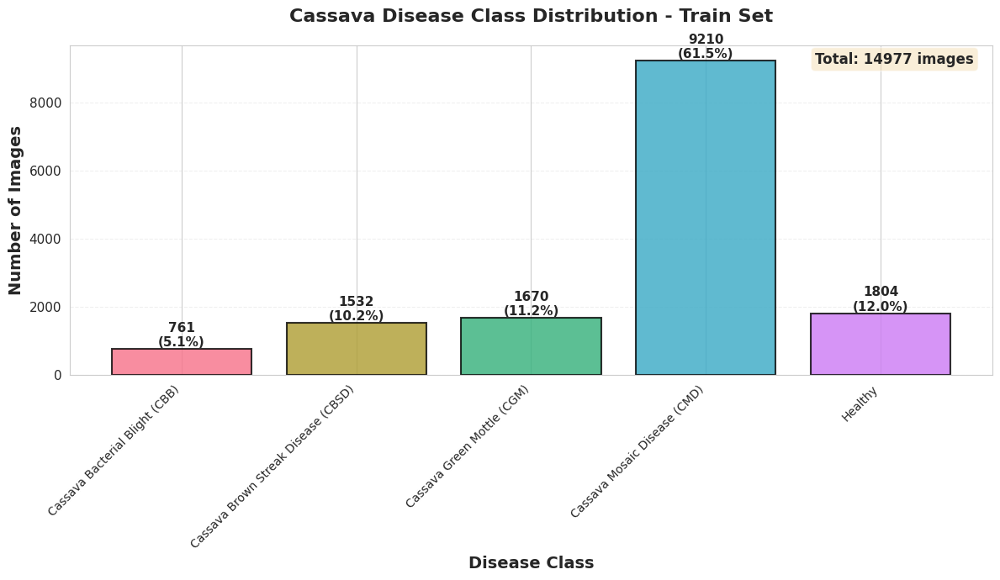

In [13]:
plot_class_distribution(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'train',
    os.path.join(os.getcwd(), 'figures', 'predefined_train_set_split_class_dist.pdf')
)

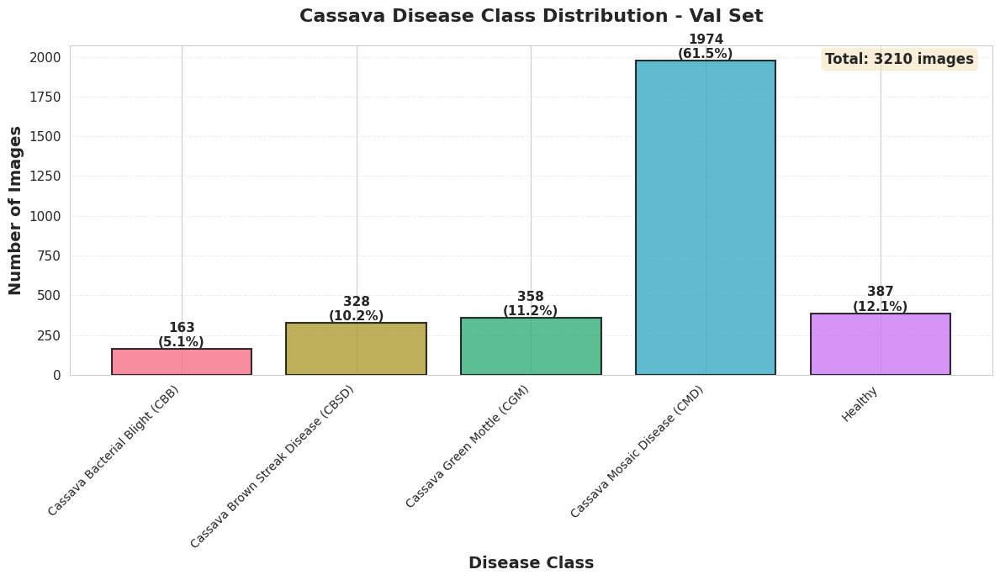

In [14]:
plot_class_distribution(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'val',
    os.path.join(os.getcwd(), 'figures', 'predefined_val_set_split_class_dist.pdf')
)

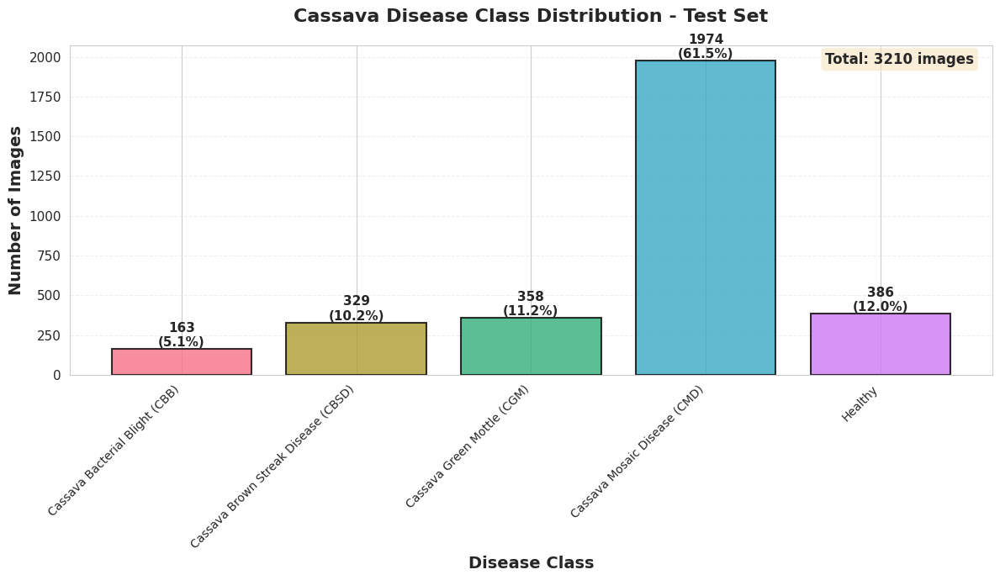

In [15]:
plot_class_distribution(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'test',
    os.path.join(os.getcwd(), 'figures', 'predefined_test_set_split_class_dist.pdf')
)

The predefined set splits are equally distributed, so we will use them. The problem is that the sets are very imbalanced on CMD class. We should downsample CMD class by a factor of 5 in order to balance class distribution on train set.

## Random Samples from each Class

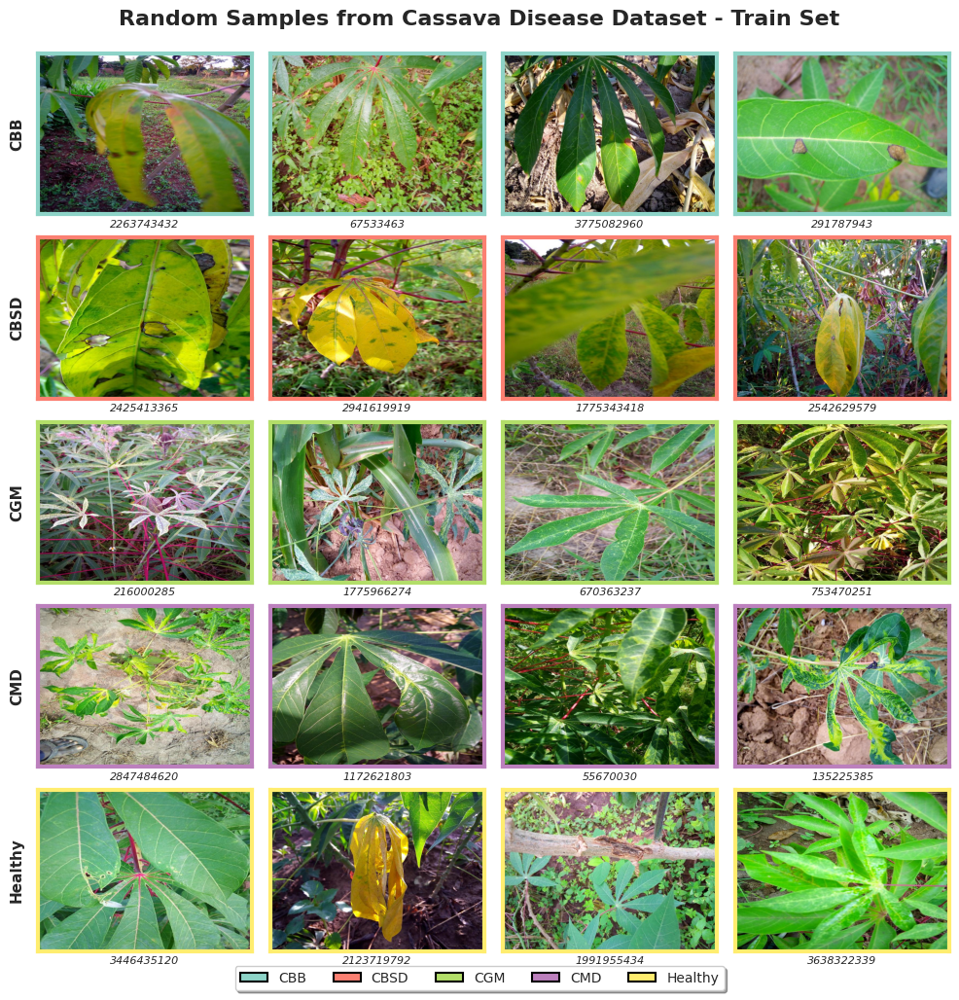

In [22]:
plot_random_samples(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'train',
    samples_per_class=4,
    figsize=(10, 10),
    seed=42,
    filename=os.path.join(os.getcwd(), 'figures', 'random_samples_train_seed42.pdf')
)

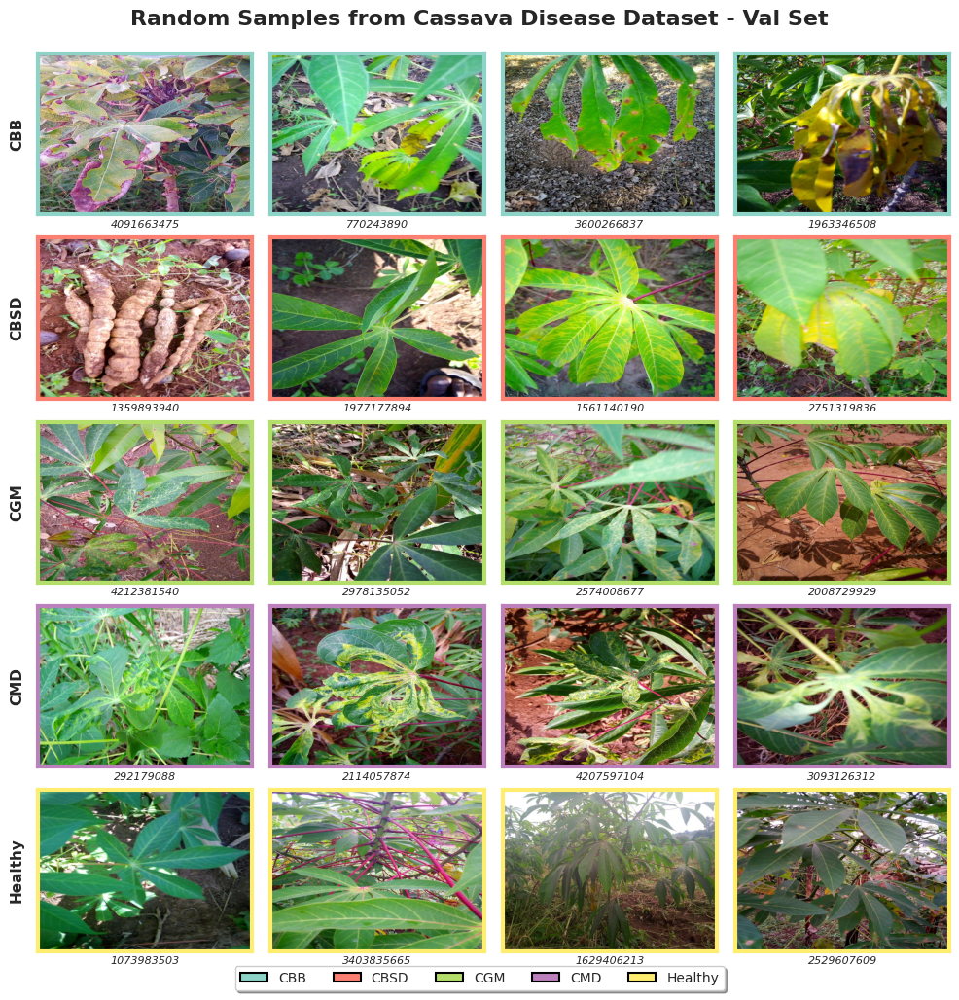

In [23]:
plot_random_samples(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'val',
    samples_per_class=4,
    figsize=(10, 10),
    seed=42,
    filename=os.path.join(os.getcwd(), 'figures', 'random_samples_val_seed42.pdf')
)

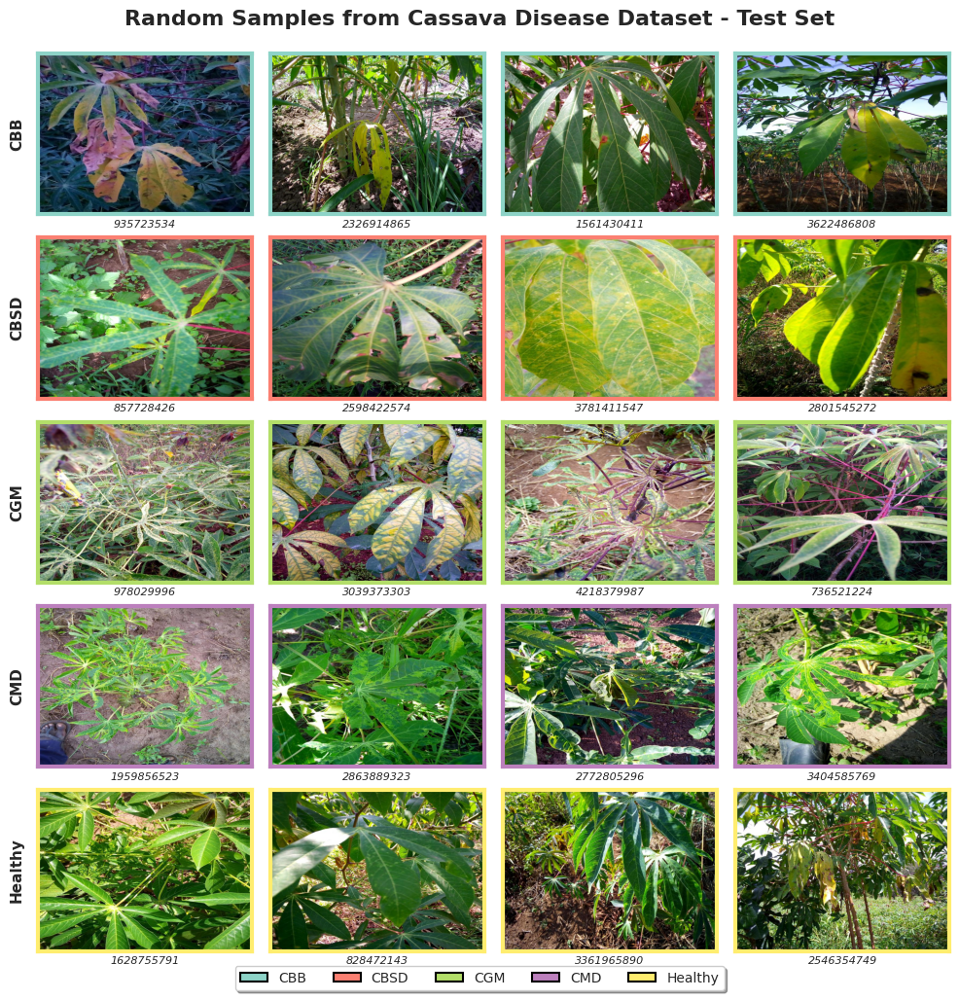

In [24]:
plot_random_samples(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'test',
    samples_per_class=4,
    figsize=(10, 10),
    seed=42,
    filename=os.path.join(os.getcwd(), 'figures', 'random_samples_test_seed42.pdf')
)

## Mean Prototypes

[INFO] Computing mean images...
Computing mean images for 5 classes...
  Processing class 0... 761 images processed
  Processing class 1... 1532 images processed
  Processing class 2... 1670 images processed
  Processing class 3... 9210 images processed
  Processing class 4... 1804 images processed
[INFO] Plot saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 01/figures/mean_protos_train.pdf


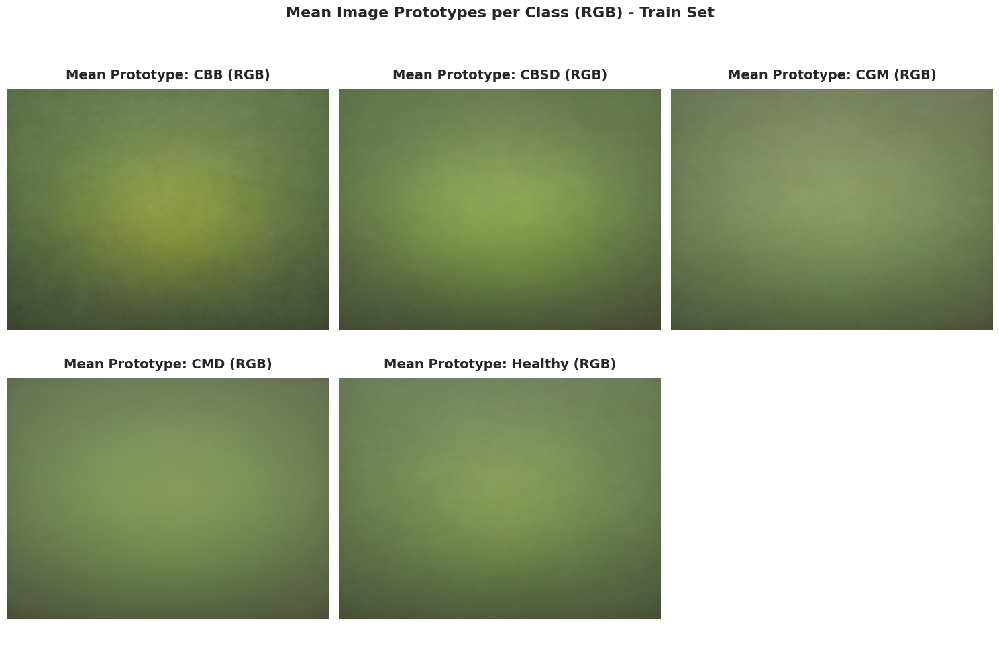

In [22]:
plot_mean_images_per_class(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'train',
    filename=os.path.join(os.getcwd(), 'figures', 'mean_protos_train.pdf')
)

[INFO] Computing mean images...
Computing mean images for 5 classes...
  Processing class 0... 163 images processed
  Processing class 1... 328 images processed
  Processing class 2... 358 images processed
  Processing class 3... 1974 images processed
  Processing class 4... 387 images processed
[INFO] Plot saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 01/figures/mean_protos_val.pdf


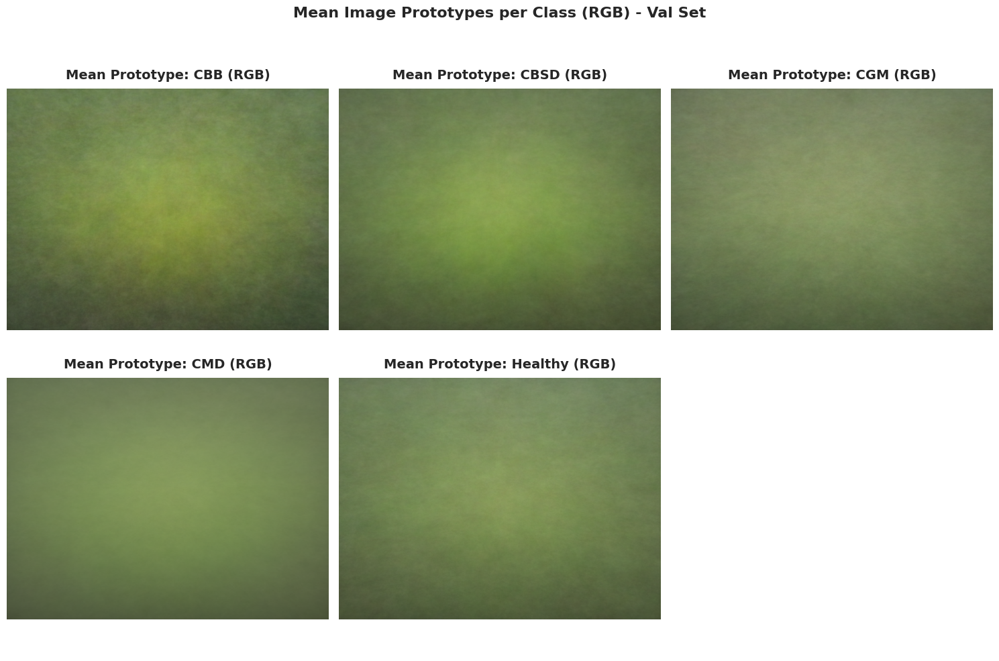

In [23]:
plot_mean_images_per_class(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'val',
    filename=os.path.join(os.getcwd(), 'figures', 'mean_protos_val.pdf')
)

[INFO] Computing mean images...
Computing mean images for 5 classes...
  Processing class 0... 163 images processed
  Processing class 1... 329 images processed
  Processing class 2... 358 images processed
  Processing class 3... 1974 images processed
  Processing class 4... 386 images processed
[INFO] Plot saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 01/figures/mean_protos_test.pdf


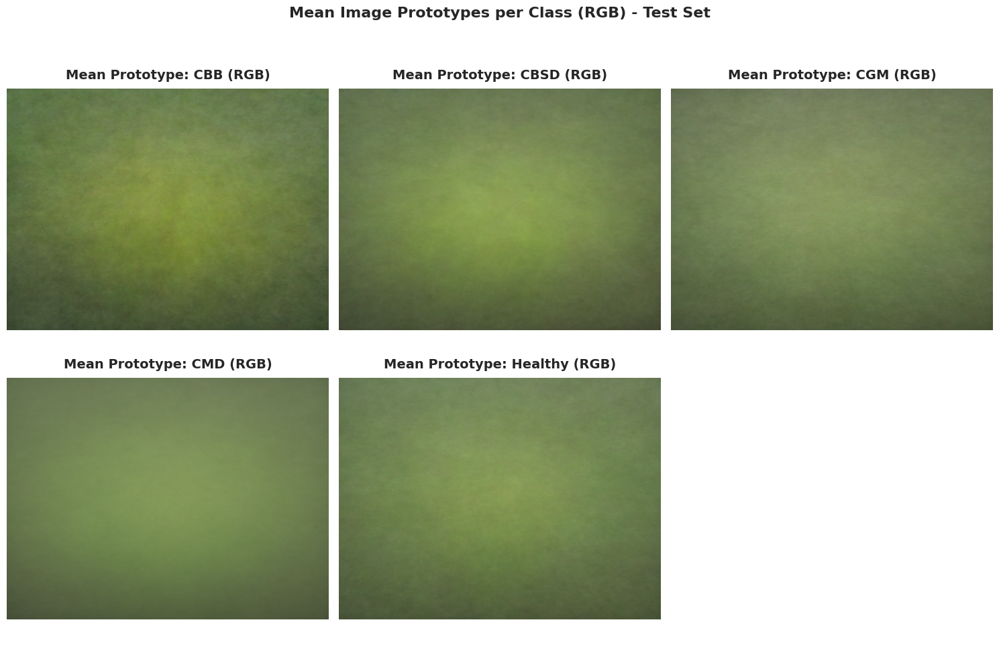

In [24]:
plot_mean_images_per_class(
    os.path.join(DATASET_PATH, 'cassava_split.csv'),
    'test',
    filename=os.path.join(os.getcwd(), 'figures', 'mean_protos_test.pdf')
)

Reparing to the mean prototypes, we can see that both CBB and CBSD classes seems to be more lighter. That makes sense because those diseases color the surface of the leaves with yellow. The CGM class is a little more brownish than the others and that may be because that disease affects not only to the leaves but also to the roots of the plant. Finally, the CMD disease seems to have smoother texture.

# Data Augmentation Study

## Train / Val / Test splits
As we have seen previously, there is a huge imbalance coming from CMD class. So, we will downsample that class on Train set.

In [ ]:
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)
# data_module = DataModule(batch_size=1024, num_workers=2)
NUM_CLASSES = 5

Seed set to 42


## Baseline: Pretrained model + Fine-Tunning with Gradual Unfreezing (per blocks)

### Setup

In [15]:
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')

# Extraer nombres de parámetros y grupos en una sola pasada
layer_names = []
group_names = []
for idx, (name, param) in enumerate(model.named_parameters()):
    layer_names.append(name)
    group_names.append(name.split('.')[0])
    print(f'{idx}: {name}')

# Encontrar índices únicos de grupos en orden inverso
seen = {}
freeze_until_idx = []
for idx, group_name in enumerate(group_names):
    if group_name not in seen:
        seen[group_name] = idx
        freeze_until_idx.append(idx)

freeze_until_idx = freeze_until_idx[::-1]
print(freeze_until_idx)

Seed set to 42


0: conv1.weight
1: bn1.weight
2: bn1.bias
3: layer1.0.conv1.weight
4: layer1.0.bn1.weight
5: layer1.0.bn1.bias
6: layer1.0.conv2.weight
7: layer1.0.bn2.weight
8: layer1.0.bn2.bias
9: layer1.1.conv1.weight
10: layer1.1.bn1.weight
11: layer1.1.bn1.bias
12: layer1.1.conv2.weight
13: layer1.1.bn2.weight
14: layer1.1.bn2.bias
15: layer2.0.conv1.weight
16: layer2.0.bn1.weight
17: layer2.0.bn1.bias
18: layer2.0.conv2.weight
19: layer2.0.bn2.weight
20: layer2.0.bn2.bias
21: layer2.0.downsample.0.weight
22: layer2.0.downsample.1.weight
23: layer2.0.downsample.1.bias
24: layer2.1.conv1.weight
25: layer2.1.bn1.weight
26: layer2.1.bn1.bias
27: layer2.1.conv2.weight
28: layer2.1.bn2.weight
29: layer2.1.bn2.bias
30: layer3.0.conv1.weight
31: layer3.0.bn1.weight
32: layer3.0.bn1.bias
33: layer3.0.conv2.weight
34: layer3.0.bn2.weight
35: layer3.0.bn2.bias
36: layer3.0.downsample.0.weight
37: layer3.0.downsample.1.weight
38: layer3.0.downsample.1.bias
39: layer3.1.conv1.weight
40: layer3.1.bn1.weight
4

### Training Loop

In [ ]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_transforms = {
    'train': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup() 

for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    log_name = f"cassava_resnet18_baseline_step_{iteration}"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:
        # Replace the final layer for our specific task (e.g., 10 classes)
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_baseline_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

In [ ]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_with_training_subsets_CM.pdf')
)

## Experiment 1: Geometric Augmentations

### Variables Setup

In [35]:
prob = {
    'horizontal_flip': 0.1,
    'vertical_flip': 0.1,
    'resized_crop': 0.2,
    'rotation': 0.2,
    'affine_trans': 0.2
}
data_transforms = {
    'train': T.Compose([
        T.Resize(size=256, interpolation=InterpolationMode.BILINEAR),
        T.RandomHorizontalFlip(p=prob['horizontal_flip']),
        T.RandomVerticalFlip(p=prob['vertical_flip']),
        T.RandomApply([T.RandomResizedCrop(size=256, scale=(0.5, 1.0), ratio=(0.75, 1.33))], p=prob['resized_crop']),
        T.RandomApply([T.RandomRotation(degrees=(-90, 90))], p=prob['rotation']),
        T.RandomApply([T.RandomAffine(degrees=(0, 0), translate=(0.25, 0.25))], p=prob['affine_trans']),
        T.CenterCrop(256),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

### Setup

In [36]:
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')

# Extraer nombres de parámetros y grupos en una sola pasada
layer_names = []
group_names = []
for idx, (name, param) in enumerate(model.named_parameters()):
    layer_names.append(name)
    group_names.append(name.split('.')[0])
    print(f'{idx}: {name}')

# Encontrar índices únicos de grupos en orden inverso
seen = {}
freeze_until_idx = []
for idx, group_name in enumerate(group_names):
    if group_name not in seen:
        seen[group_name] = idx
        freeze_until_idx.append(idx)

freeze_until_idx = freeze_until_idx[::-1]
print(freeze_until_idx)

Seed set to 42


0: conv1.weight
1: bn1.weight
2: bn1.bias
3: layer1.0.conv1.weight
4: layer1.0.bn1.weight
5: layer1.0.bn1.bias
6: layer1.0.conv2.weight
7: layer1.0.bn2.weight
8: layer1.0.bn2.bias
9: layer1.1.conv1.weight
10: layer1.1.bn1.weight
11: layer1.1.bn1.bias
12: layer1.1.conv2.weight
13: layer1.1.bn2.weight
14: layer1.1.bn2.bias
15: layer2.0.conv1.weight
16: layer2.0.bn1.weight
17: layer2.0.bn1.bias
18: layer2.0.conv2.weight
19: layer2.0.bn2.weight
20: layer2.0.bn2.bias
21: layer2.0.downsample.0.weight
22: layer2.0.downsample.1.weight
23: layer2.0.downsample.1.bias
24: layer2.1.conv1.weight
25: layer2.1.bn1.weight
26: layer2.1.bn1.bias
27: layer2.1.conv2.weight
28: layer2.1.bn2.weight
29: layer2.1.bn2.bias
30: layer3.0.conv1.weight
31: layer3.0.bn1.weight
32: layer3.0.bn1.bias
33: layer3.0.conv2.weight
34: layer3.0.bn2.weight
35: layer3.0.bn2.bias
36: layer3.0.downsample.0.weight
37: layer3.0.downsample.1.weight
38: layer3.0.downsample.1.bias
39: layer3.1.conv1.weight
40: layer3.1.bn1.weight
4

### Training Loop

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
2.6 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0477


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.18456 (best 1.18456), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=1.18.ckpt' as top 1


Average validation loss for epoch 0: 1.1830
Average training loss for epoch 0: 1.3248


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.07828 (best 1.07828), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=1-val_loss=1.08.ckpt' as top 1


Average validation loss for epoch 1: 1.0786
Average training loss for epoch 1: 1.1129


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 1.02821 (best 1.02821), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=2-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 2: 1.0313
Average training loss for epoch 2: 1.0591


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 1.02680 (best 1.02680), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=3-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 3: 1.0310
Average training loss for epoch 3: 1.0255


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.0324
Average training loss for epoch 4: 1.0068


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 1.02147 (best 1.02147), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=5-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 5: 1.0230
Average training loss for epoch 5: 1.0087


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0306
Average training loss for epoch 6: 0.9790


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0310
Average training loss for epoch 7: 0.9887


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0292
Average training loss for epoch 8: 0.9816


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' reached 1.01477 (best 1.01477), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=9-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 9: 1.0187
Average training loss for epoch 9: 0.9593


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' reached 1.01386 (best 1.01386), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=10-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 10: 1.0169
Average training loss for epoch 10: 0.9618


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' reached 1.01232 (best 1.01232), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=11-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 11: 1.0161
Average training loss for epoch 11: 0.9560


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' reached 1.01161 (best 1.01161), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=12-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 12: 1.0150
Average training loss for epoch 12: 0.9496


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0185
Average training loss for epoch 13: 0.9544


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0161
Average training loss for epoch 14: 0.9554


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' reached 1.01076 (best 1.01076), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=15-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 15: 1.0139
Average training loss for epoch 15: 0.9521


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' reached 1.01035 (best 1.01035), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=16-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 16: 1.0134
Average training loss for epoch 16: 0.9435


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.0183
Average training loss for epoch 17: 0.9482


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.0144
Average training loss for epoch 18: 0.9458


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2440: 'val_loss' was not in top 1


Average validation loss for epoch 19: 1.0148
Average training loss for epoch 19: 0.9489


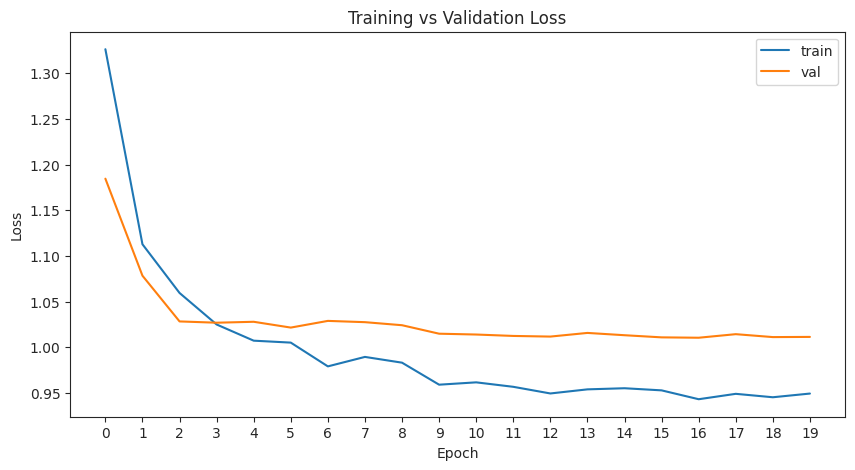

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
8.4 M     Trainable params
2.8 M     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.6673


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.86494 (best 0.86494), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 0: 0.8692
Average training loss for epoch 0: 1.0205


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 0.9056
Average training loss for epoch 1: 0.8066


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.84649 (best 0.84649), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=2-val_loss=0.85.ckpt' as top 1


Average validation loss for epoch 2: 0.8534
Average training loss for epoch 2: 0.7307


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9432
Average training loss for epoch 3: 0.6582


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9525
Average training loss for epoch 4: 0.6119


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.9807
Average training loss for epoch 5: 0.5581


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0621
Average training loss for epoch 6: 0.5160


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0171
Average training loss for epoch 7: 0.4829


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.1217
Average training loss for epoch 8: 0.4415


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0581
Average training loss for epoch 9: 0.3281


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1412
Average training loss for epoch 10: 0.2747


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.1691
Average training loss for epoch 11: 0.2661


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.1073
Average training loss for epoch 12: 0.2661


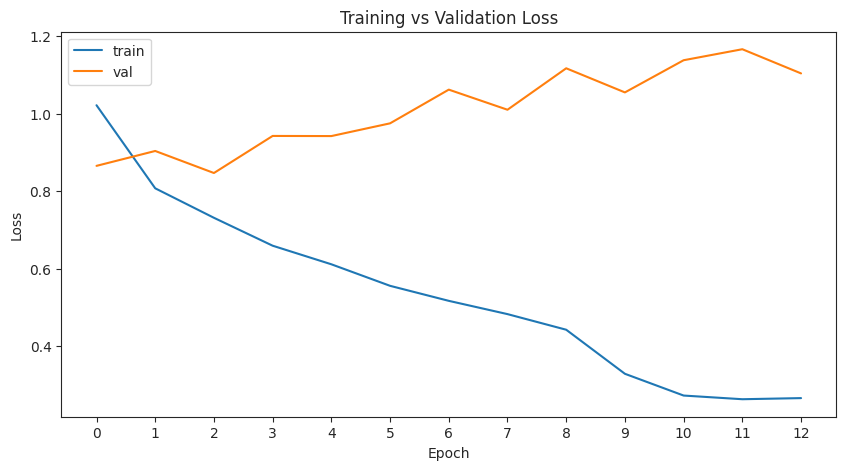

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
10.5 M    Trainable params
683 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.5228


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.91972 (best 0.91972), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 0: 0.9230
Average training loss for epoch 0: 0.8664


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 0.9519
Average training loss for epoch 1: 0.7186


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.84822 (best 0.84822), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=2-val_loss=0.85-v1.ckpt' as top 1


Average validation loss for epoch 2: 0.8580
Average training loss for epoch 2: 0.6691


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.77806 (best 0.77806), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=3-val_loss=0.78.ckpt' as top 1


Average validation loss for epoch 3: 0.7833
Average training loss for epoch 3: 0.5968


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9290
Average training loss for epoch 4: 0.5752


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8471
Average training loss for epoch 5: 0.5253


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.8580
Average training loss for epoch 6: 0.4962


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9771
Average training loss for epoch 7: 0.4502


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0627
Average training loss for epoch 8: 0.4269


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9582
Average training loss for epoch 9: 0.4172


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9208
Average training loss for epoch 10: 0.3025


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9808
Average training loss for epoch 11: 0.2775


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9946
Average training loss for epoch 12: 0.2508


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0020
Average training loss for epoch 13: 0.2404


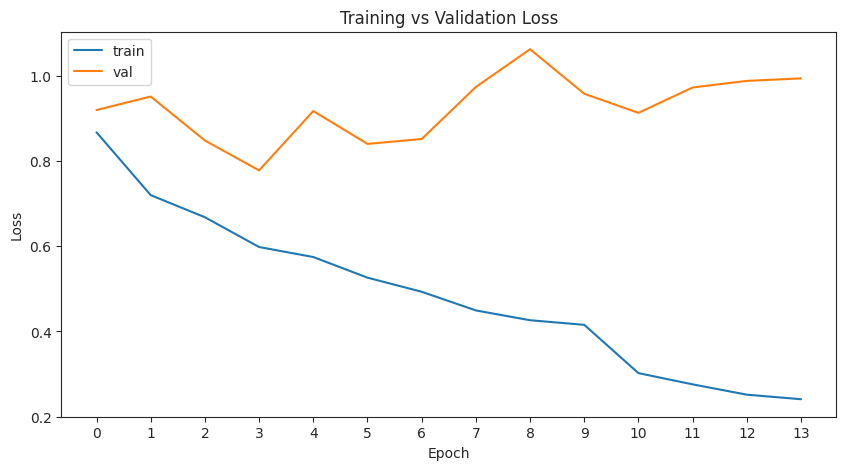

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.0 M    Trainable params
157 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.4965


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.56774 (best 1.56774), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=1.57.ckpt' as top 1


Average validation loss for epoch 0: 1.5674
Average training loss for epoch 0: 0.7130


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.91529 (best 0.91529), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=1-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 1: 0.9256
Average training loss for epoch 1: 0.6164


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.9410
Average training loss for epoch 2: 0.5779


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9244
Average training loss for epoch 3: 0.5448


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.1041
Average training loss for epoch 4: 0.4982


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.9715
Average training loss for epoch 5: 0.4761


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.1222
Average training loss for epoch 6: 0.4608


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.1456
Average training loss for epoch 7: 0.4183


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' reached 0.86832 (best 0.86832), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=8-val_loss=0.87.ckpt' as top 1


Average validation loss for epoch 8: 0.8773
Average training loss for epoch 8: 0.3114


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9118
Average training loss for epoch 9: 0.2649


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9161
Average training loss for epoch 10: 0.2534


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9612
Average training loss for epoch 11: 0.2471


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9679
Average training loss for epoch 12: 0.2359


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.9832
Average training loss for epoch 13: 0.2342


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0201
Average training loss for epoch 14: 0.2165


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 1.0131
Average training loss for epoch 15: 0.2062


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 1.0112
Average training loss for epoch 16: 0.2045


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.0143
Average training loss for epoch 17: 0.2049


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.0226
Average training loss for epoch 18: 0.2068


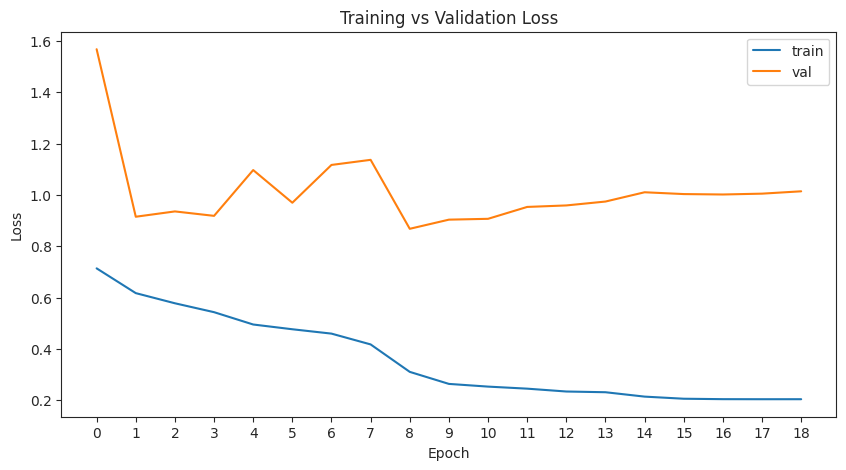

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.5 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.4392


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.38504 (best 1.38504), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=1.39.ckpt' as top 1


Average validation loss for epoch 0: 1.3994
Average training loss for epoch 0: 0.4984


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.03354 (best 1.03354), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=1-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 1: 1.0421
Average training loss for epoch 1: 0.4573


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 1.01533 (best 1.01533), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=2-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 2: 1.0222
Average training loss for epoch 2: 0.4306


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.4208
Average training loss for epoch 3: 0.4168


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' reached 0.93545 (best 0.93545), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=4-val_loss=0.94.ckpt' as top 1


Average validation loss for epoch 4: 0.9447
Average training loss for epoch 4: 0.4001


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.1535
Average training loss for epoch 5: 0.3873


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.1537
Average training loss for epoch 6: 0.3741


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.2211
Average training loss for epoch 7: 0.3702


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.9705
Average training loss for epoch 8: 0.3717


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.1697
Average training loss for epoch 9: 0.3486


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1716
Average training loss for epoch 10: 0.3255


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9672
Average training loss for epoch 11: 0.2626


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9735
Average training loss for epoch 12: 0.2287


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0182
Average training loss for epoch 13: 0.2047


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0144
Average training loss for epoch 14: 0.2112


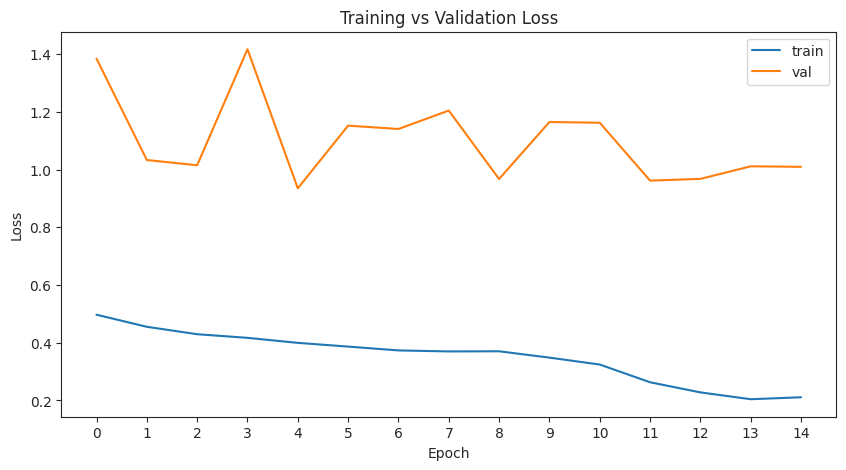

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.4 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3357


Training: |                                               | 0/? [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7836e9dda840>
Traceback (most recent call last):
  File "/home/alumno/py313ml/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/home/alumno/py313ml/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py", line 1647, in _shutdown_workers
    if w.is_alive():
  File "/home/alumno/.local/share/uv/python/cpython-3.13.7-linux-x86_64-gnu/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7836e9dda840>
Traceback (most recent call last):
  File "/home/alumno/py313ml/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py", line 1664, in __del__
    self._shutdown_workers()
  File "/home/alumno/py313ml/.venv/lib/p

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.01292 (best 1.01292), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 0: 1.0220
Average training loss for epoch 0: 0.4027


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.00700 (best 1.00700), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=1-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 1: 1.0068
Average training loss for epoch 1: 0.3782


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.0803
Average training loss for epoch 2: 0.3730


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.97187 (best 0.97187), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=3-val_loss=0.97.ckpt' as top 1


Average validation loss for epoch 3: 0.9807
Average training loss for epoch 3: 0.3731


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.1408
Average training loss for epoch 4: 0.3426


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.1730
Average training loss for epoch 5: 0.3523


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0350
Average training loss for epoch 6: 0.3349


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.2905
Average training loss for epoch 7: 0.3184


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.1612
Average training loss for epoch 8: 0.3223


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.2374
Average training loss for epoch 9: 0.3150


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.0144
Average training loss for epoch 10: 0.2337


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.0329
Average training loss for epoch 11: 0.2058


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.0316
Average training loss for epoch 12: 0.1891


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0398
Average training loss for epoch 13: 0.1836


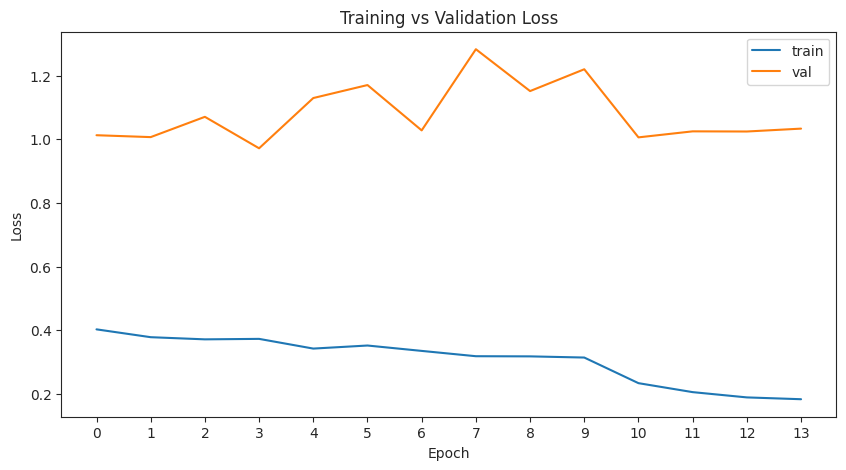

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0378


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.13610 (best 1.13610), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=0-val_loss=1.14.ckpt' as top 1


Average validation loss for epoch 0: 1.1402
Average training loss for epoch 0: 0.3686


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.11241 (best 1.11241), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=1-val_loss=1.11.ckpt' as top 1


Average validation loss for epoch 1: 1.1265
Average training loss for epoch 1: 0.3709


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.1427
Average training loss for epoch 2: 0.3537


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.1315
Average training loss for epoch 3: 0.3389


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' reached 1.07835 (best 1.07835), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=4-val_loss=1.08.ckpt' as top 1


Average validation loss for epoch 4: 1.0890
Average training loss for epoch 4: 0.3305


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 1.02425 (best 1.02425), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=5-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 5: 1.0298
Average training loss for epoch 5: 0.3269


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.1028
Average training loss for epoch 6: 0.3127


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.1111
Average training loss for epoch 7: 0.3110


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0843
Average training loss for epoch 8: 0.2960


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.1153
Average training loss for epoch 9: 0.2931


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.0613
Average training loss for epoch 10: 0.2964


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.1618
Average training loss for epoch 11: 0.3016


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' reached 0.97955 (best 0.97955), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_epoch=12-val_loss=0.98.ckpt' as top 1


Average validation loss for epoch 12: 0.9867
Average training loss for epoch 12: 0.2106


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0016
Average training loss for epoch 13: 0.1951


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0145
Average training loss for epoch 14: 0.1802


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 1.0569
Average training loss for epoch 15: 0.1694


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 1.0986
Average training loss for epoch 16: 0.1708


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.0692
Average training loss for epoch 17: 0.1631


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.0759
Average training loss for epoch 18: 0.1601


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2440: 'val_loss' was not in top 1


Average validation loss for epoch 19: 1.0838
Average training loss for epoch 19: 0.1526


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 2562: 'val_loss' was not in top 1


Average validation loss for epoch 20: 1.0682
Average training loss for epoch 20: 0.1525


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 2684: 'val_loss' was not in top 1


Average validation loss for epoch 21: 1.0732
Average training loss for epoch 21: 0.1561


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 2806: 'val_loss' was not in top 1


Average validation loss for epoch 22: 1.0772
Average training loss for epoch 22: 0.1466


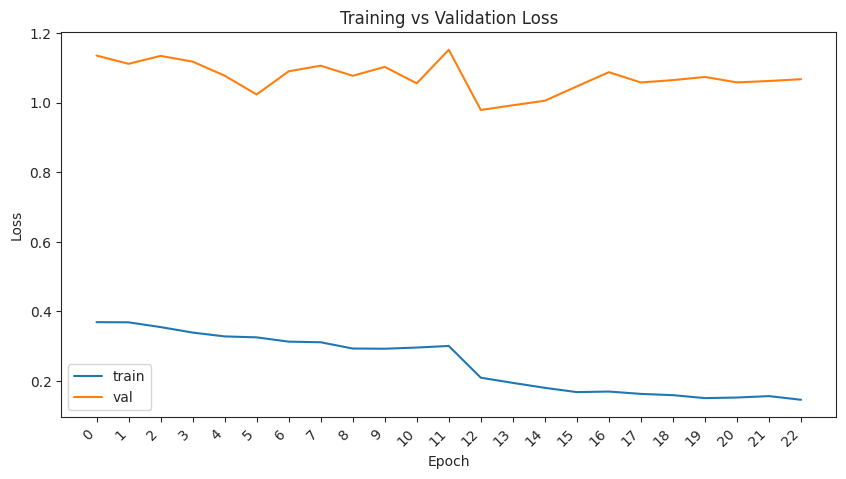

In [37]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()
for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    # Setup each subset
    #data_module.subset_idx = iteration 

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_geo_aug"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:
        # Replace the final layer for our specific task (e.g., 10 classes)
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_geo_aug_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

Generating predictions...
F1 Score (macro): 0.6893
Confusion matrix saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/figures/cassava_resnet18_gradual_unfreezing_geo_aug_CM.pdf


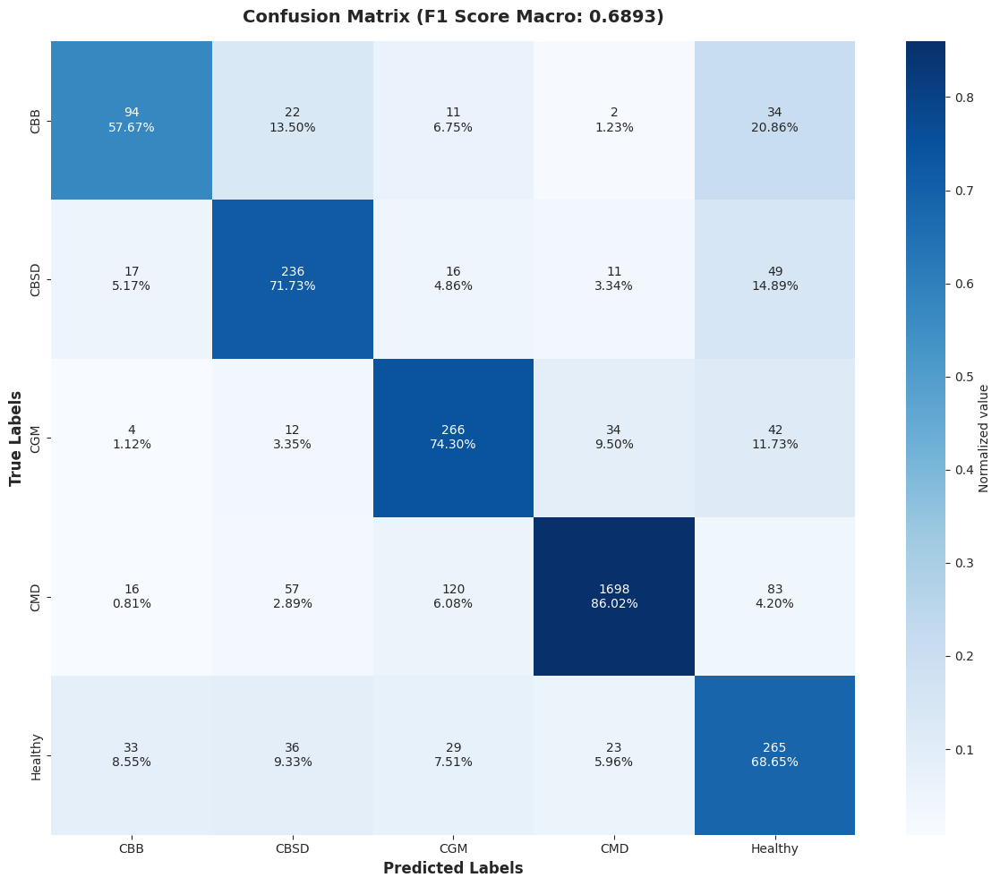

In [38]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_geo_aug_CM.pdf')
)

## Experiment 1 bis: Adding Dropout2d layers

### Setup

In [42]:
def add_dropout_to_basicblock(block, p=0.2):
    original_forward = block.forward
    
    def new_forward(x):
        identity = x
        
        out = block.conv1(x)
        out = block.bn1(out)
        out = block.relu(out)
        
        # Solo aplicar dropout si algún parámetro del bloque requiere gradientes
        if any(p.requires_grad for p in block.parameters()):
            out = nn.functional.dropout2d(out, p=p, training=block.training)
        
        out = block.conv2(out)
        out = block.bn2(out)
        
        if block.downsample is not None:
            identity = block.downsample(x)
        
        out += identity
        out = block.relu(out)
        
        return out
    
    block.forward = new_forward
    return block

### Training Loop

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
2.6 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0477


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.18456 (best 1.18456), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=1.18.ckpt' as top 1


Average validation loss for epoch 0: 1.1830
Average training loss for epoch 0: 1.3248


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.07828 (best 1.07828), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=1.08.ckpt' as top 1


Average validation loss for epoch 1: 1.0786
Average training loss for epoch 1: 1.1129


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 1.02821 (best 1.02821), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=2-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 2: 1.0313
Average training loss for epoch 2: 1.0591


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 1.02680 (best 1.02680), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=3-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 3: 1.0310
Average training loss for epoch 3: 1.0255


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.0324
Average training loss for epoch 4: 1.0068


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 1.02147 (best 1.02147), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=5-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 5: 1.0230
Average training loss for epoch 5: 1.0087


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0306
Average training loss for epoch 6: 0.9790


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0310
Average training loss for epoch 7: 0.9887


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0292
Average training loss for epoch 8: 0.9816


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' reached 1.01477 (best 1.01477), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=9-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 9: 1.0187
Average training loss for epoch 9: 0.9593


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' reached 1.01386 (best 1.01386), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=10-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 10: 1.0169
Average training loss for epoch 10: 0.9618


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' reached 1.01232 (best 1.01232), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=11-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 11: 1.0161
Average training loss for epoch 11: 0.9560


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' reached 1.01161 (best 1.01161), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=12-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 12: 1.0150
Average training loss for epoch 12: 0.9496


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0185
Average training loss for epoch 13: 0.9544


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0161
Average training loss for epoch 14: 0.9554


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' reached 1.01076 (best 1.01076), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=15-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 15: 1.0139
Average training loss for epoch 15: 0.9521


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' reached 1.01035 (best 1.01035), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=16-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 16: 1.0134
Average training loss for epoch 16: 0.9435


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.0183
Average training loss for epoch 17: 0.9482


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.0144
Average training loss for epoch 18: 0.9458


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2440: 'val_loss' was not in top 1


Average validation loss for epoch 19: 1.0148
Average training loss for epoch 19: 0.9489


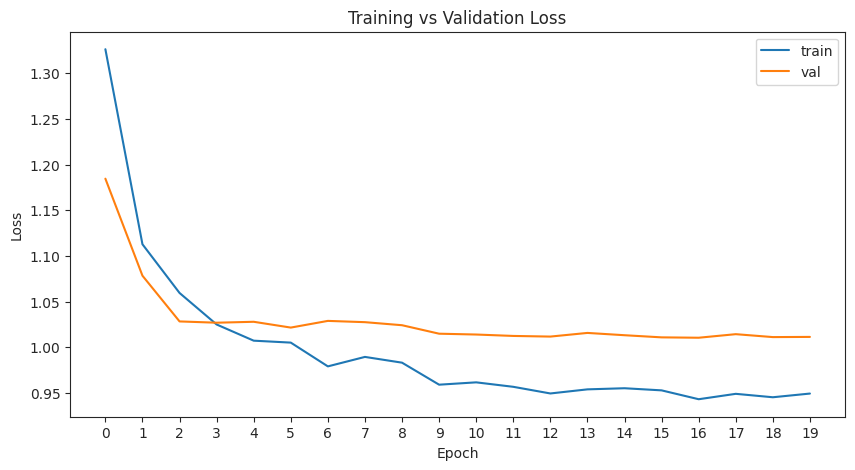

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
8.4 M     Trainable params
2.8 M     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.6673


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.89539 (best 0.89539), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.90.ckpt' as top 1


Average validation loss for epoch 0: 0.8969
Average training loss for epoch 0: 1.0908


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.85725 (best 0.85725), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.86-v1.ckpt' as top 1


Average validation loss for epoch 1: 0.8608
Average training loss for epoch 1: 0.8581


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.84946 (best 0.84946), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=2-val_loss=0.85.ckpt' as top 1


Average validation loss for epoch 2: 0.8555
Average training loss for epoch 2: 0.7908


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.82293 (best 0.82293), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=3-val_loss=0.82.ckpt' as top 1


Average validation loss for epoch 3: 0.8280
Average training loss for epoch 3: 0.7254


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8703
Average training loss for epoch 4: 0.6959


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8987
Average training loss for epoch 5: 0.6454


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.9794
Average training loss for epoch 6: 0.6033


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9190
Average training loss for epoch 7: 0.5843


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.9699
Average training loss for epoch 8: 0.5575


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9185
Average training loss for epoch 9: 0.5155


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9377
Average training loss for epoch 10: 0.4151


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9473
Average training loss for epoch 11: 0.3884


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9634
Average training loss for epoch 12: 0.3594


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0208
Average training loss for epoch 13: 0.3531


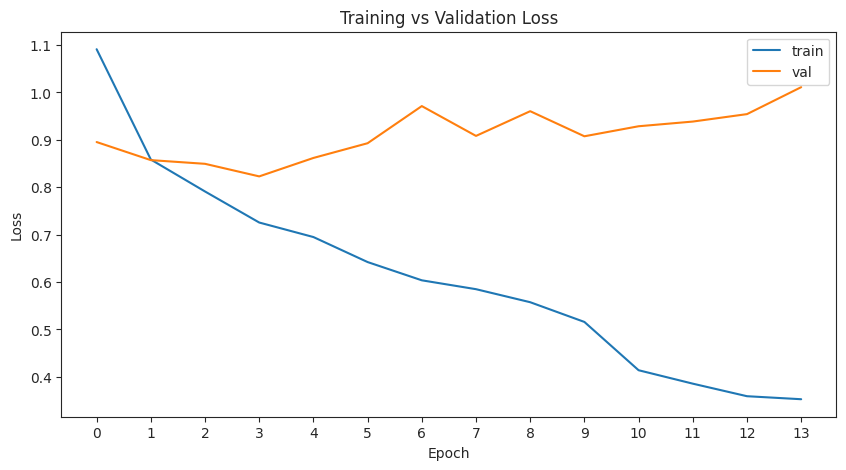

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
10.5 M    Trainable params
683 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.6233


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.90786 (best 0.90786), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 0: 0.9146
Average training loss for epoch 0: 0.9582


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.76882 (best 0.76882), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.77.ckpt' as top 1


Average validation loss for epoch 1: 0.7762
Average training loss for epoch 1: 0.8295


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.76028 (best 0.76028), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=2-val_loss=0.76.ckpt' as top 1


Average validation loss for epoch 2: 0.7645
Average training loss for epoch 2: 0.7460


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.7852
Average training loss for epoch 3: 0.7288


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.7764
Average training loss for epoch 4: 0.6889


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8263
Average training loss for epoch 5: 0.6560


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.8280
Average training loss for epoch 6: 0.6140


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8064
Average training loss for epoch 7: 0.5942


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.7719
Average training loss for epoch 8: 0.5676


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' reached 0.76007 (best 0.76007), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=9-val_loss=0.76.ckpt' as top 1


Average validation loss for epoch 9: 0.7707
Average training loss for epoch 9: 0.4813


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.8013
Average training loss for epoch 10: 0.4566


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8219
Average training loss for epoch 11: 0.4289


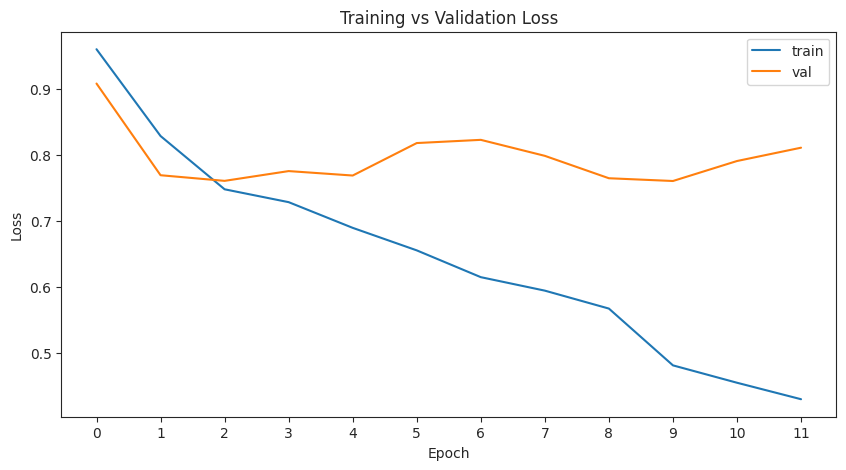

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.0 M    Trainable params
157 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3666


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.85011 (best 0.85011), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.85.ckpt' as top 1


Average validation loss for epoch 0: 0.8539
Average training loss for epoch 0: 0.8107


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.79743 (best 0.79743), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.80.ckpt' as top 1


Average validation loss for epoch 1: 0.8080
Average training loss for epoch 1: 0.7109


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8113
Average training loss for epoch 2: 0.6682


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.8066
Average training loss for epoch 3: 0.6373


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8349
Average training loss for epoch 4: 0.6184


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8669
Average training loss for epoch 5: 0.5874


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.8281
Average training loss for epoch 6: 0.5633


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8375
Average training loss for epoch 7: 0.5521


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8240
Average training loss for epoch 8: 0.4500


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.8342
Average training loss for epoch 9: 0.4183


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.8490
Average training loss for epoch 10: 0.4068


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8425
Average training loss for epoch 11: 0.3857


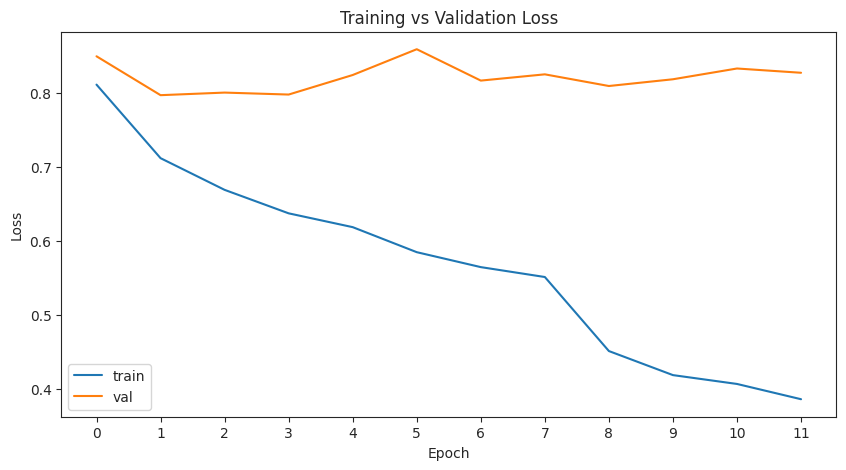

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.5 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.4982


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.86223 (best 0.86223), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 0: 0.8727
Average training loss for epoch 0: 0.8648


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.80283 (best 0.80283), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.80-v1.ckpt' as top 1


Average validation loss for epoch 1: 0.8099
Average training loss for epoch 1: 0.7840


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8287
Average training loss for epoch 2: 0.7369


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9145
Average training loss for epoch 3: 0.7040


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9045
Average training loss for epoch 4: 0.6670


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 0.79911 (best 0.79911), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=5-val_loss=0.80.ckpt' as top 1


Average validation loss for epoch 5: 0.8112
Average training loss for epoch 5: 0.6447


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' reached 0.79372 (best 0.79372), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=6-val_loss=0.79.ckpt' as top 1


Average validation loss for epoch 6: 0.7980
Average training loss for epoch 6: 0.6467


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9293
Average training loss for epoch 7: 0.6112


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8693
Average training loss for epoch 8: 0.5966


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.8215
Average training loss for epoch 9: 0.5837


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9250
Average training loss for epoch 10: 0.5483


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8218
Average training loss for epoch 11: 0.5381


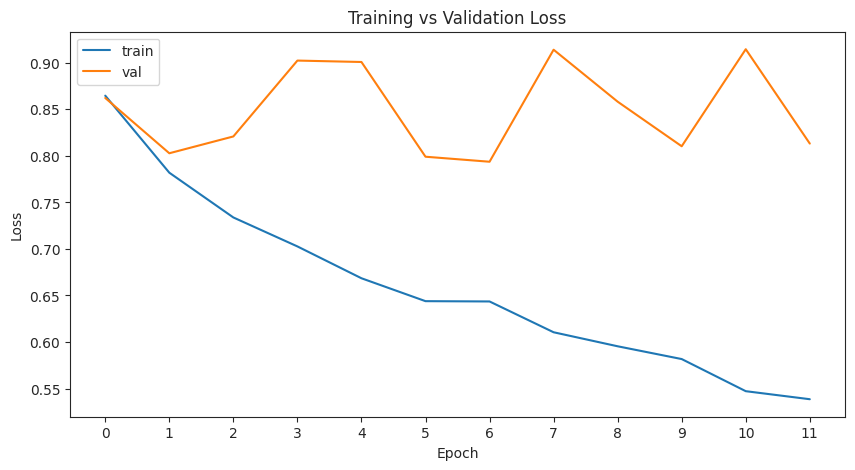

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.4 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3881


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.88418 (best 0.88418), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.88.ckpt' as top 1


Average validation loss for epoch 0: 0.8947
Average training loss for epoch 0: 0.6284


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.86722 (best 0.86722), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.87.ckpt' as top 1


Average validation loss for epoch 1: 0.8769
Average training loss for epoch 1: 0.6017


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.9676
Average training loss for epoch 2: 0.5673


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9580
Average training loss for epoch 3: 0.5543


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9096
Average training loss for epoch 4: 0.5402


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.9300
Average training loss for epoch 5: 0.5339


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.9623
Average training loss for epoch 6: 0.5018


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9376
Average training loss for epoch 7: 0.4972


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8944
Average training loss for epoch 8: 0.4322


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9097
Average training loss for epoch 9: 0.4014


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9277
Average training loss for epoch 10: 0.3835


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9518
Average training loss for epoch 11: 0.3560


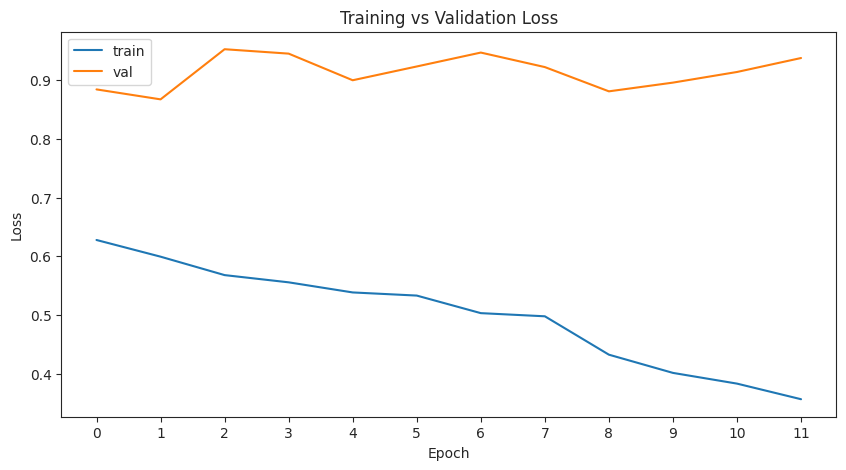

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.8659


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.91518 (best 0.91518), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=0-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 0: 0.9250
Average training loss for epoch 0: 0.6018


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.81411 (best 0.81411), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_aug_dropout_epoch=1-val_loss=0.81.ckpt' as top 1


Average validation loss for epoch 1: 0.8232
Average training loss for epoch 1: 0.5688


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8798
Average training loss for epoch 2: 0.5602


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9100
Average training loss for epoch 3: 0.5341


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9851
Average training loss for epoch 4: 0.5282


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.9101
Average training loss for epoch 5: 0.5199


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0258
Average training loss for epoch 6: 0.5088


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9633
Average training loss for epoch 7: 0.4968


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8773
Average training loss for epoch 8: 0.4190


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.8832
Average training loss for epoch 9: 0.3809


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9090
Average training loss for epoch 10: 0.3736


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9376
Average training loss for epoch 11: 0.3531


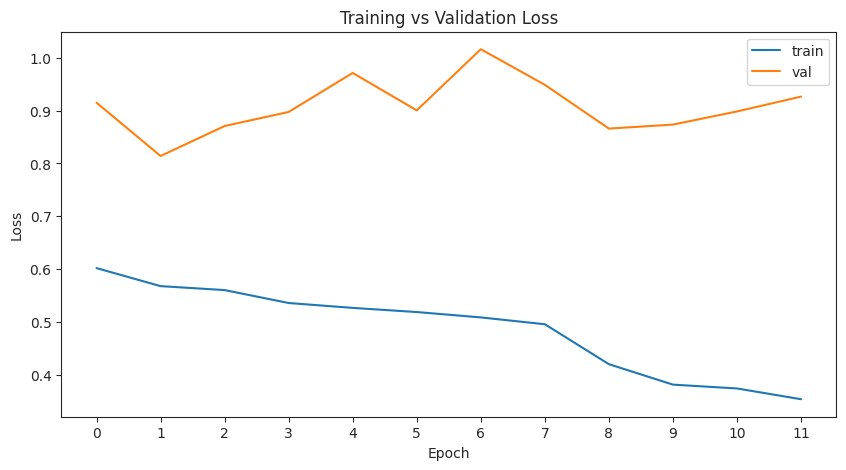

In [43]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()
for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    # Setup each subset
    #data_module.subset_idx = iteration 

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_geo_aug_dropout"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:

        # Aplicar a todos los bloques
        for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
            layer = getattr(model, layer_name)
            for block in layer:
                add_dropout_to_basicblock(block, p=0.2)
        
        # Cambiar última capa
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_geo_aug_dropout_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

Generating predictions...
F1 Score (macro): 0.6952
Confusion matrix saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/figures/cassava_resnet18_gradual_unfreezing_geo_aug_dropout_CM.pdf


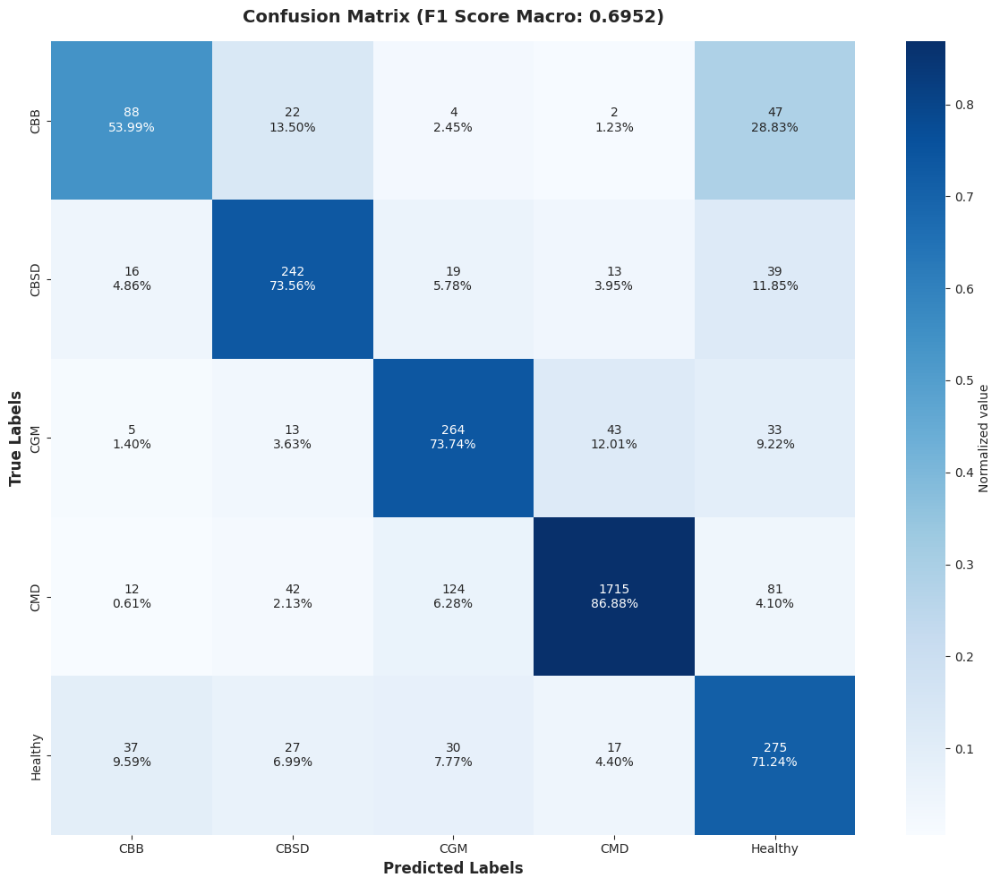

In [44]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_geo_aug_dropout_CM.pdf')
)

## Experiment 2: Photometric Augmentations

### Variables Setup

In [47]:
class GaussianNoise:
    def __init__(self, mean=0., std=0.1):
        self.mean = mean
        self.std = std
    
    def __call__(self, img):
        noise = torch.randn(img.size()) * self.std + self.mean
        return img + noise
    
    def __repr__(self):
        return f"{self.__class__.__name__}(mean={self.mean}, std={self.std})"

In [52]:
prob = {
    'color_jitter': 0.5,
    'gauss_blur': 0.1,
    'gauss_noise': 0.1,
}
data_transforms = {
    'train': T.Compose([
        T.Resize(size=256, interpolation=InterpolationMode.BILINEAR),
        T.RandomApply([T.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.025)], p=prob['color_jitter']),
        T.RandomApply([T.GaussianBlur(kernel_size=(3,3), sigma=(0.1, 2.0))], p=prob['gauss_blur']),
        T.ToTensor(),
        T.RandomApply([GaussianNoise()], p=prob['gauss_noise']),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

### Training Loop

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
2.6 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0477


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.20514 (best 1.20514), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=1.21.ckpt' as top 1


Average validation loss for epoch 0: 1.2041
Average training loss for epoch 0: 1.3422


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.08942 (best 1.08942), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=1-val_loss=1.09.ckpt' as top 1


Average validation loss for epoch 1: 1.0899
Average training loss for epoch 1: 1.1270


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 1.05058 (best 1.05058), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=2-val_loss=1.05.ckpt' as top 1


Average validation loss for epoch 2: 1.0538
Average training loss for epoch 2: 1.0601


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.0549
Average training loss for epoch 3: 1.0306


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.0572
Average training loss for epoch 4: 1.0111


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.0646
Average training loss for epoch 5: 1.0013


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0613
Average training loss for epoch 6: 0.9798


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0637
Average training loss for epoch 7: 0.9815


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0689
Average training loss for epoch 8: 0.9787


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0533
Average training loss for epoch 9: 0.9446


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.0540
Average training loss for epoch 10: 0.9484


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' reached 1.05019 (best 1.05019), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=11-val_loss=1.05.ckpt' as top 1


Average validation loss for epoch 11: 1.0522
Average training loss for epoch 11: 0.9491


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.0540
Average training loss for epoch 12: 0.9432


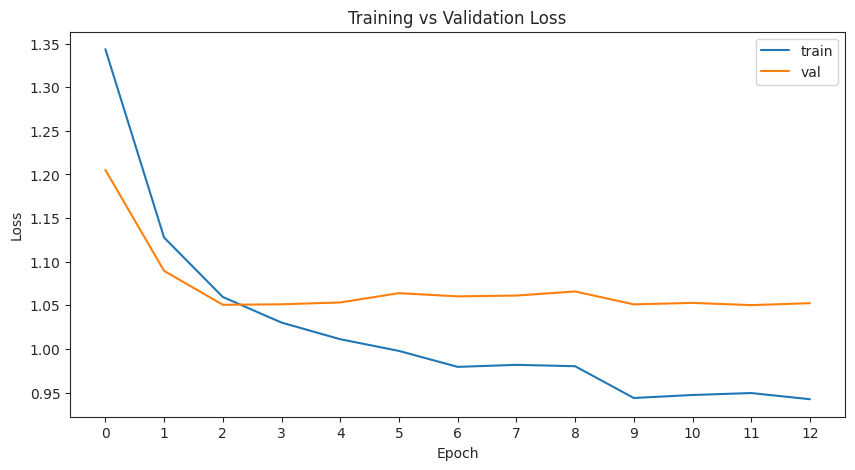

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
8.4 M     Trainable params
2.8 M     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.6702


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.93016 (best 0.93016), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=0.93.ckpt' as top 1


Average validation loss for epoch 0: 0.9323
Average training loss for epoch 0: 1.1298


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.91153 (best 0.91153), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=1-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 1: 0.9145
Average training loss for epoch 1: 0.8297


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.86861 (best 0.86861), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=2-val_loss=0.87.ckpt' as top 1


Average validation loss for epoch 2: 0.8707
Average training loss for epoch 2: 0.7090


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.0732
Average training loss for epoch 3: 0.6224


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.1613
Average training loss for epoch 4: 0.5137


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.2305
Average training loss for epoch 5: 0.4139


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.3243
Average training loss for epoch 6: 0.3446


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.4158
Average training loss for epoch 7: 0.3014


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.6383
Average training loss for epoch 8: 0.2417


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.4071
Average training loss for epoch 9: 0.1417


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.5366
Average training loss for epoch 10: 0.0987


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.6851
Average training loss for epoch 11: 0.1006


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.7349
Average training loss for epoch 12: 0.0761


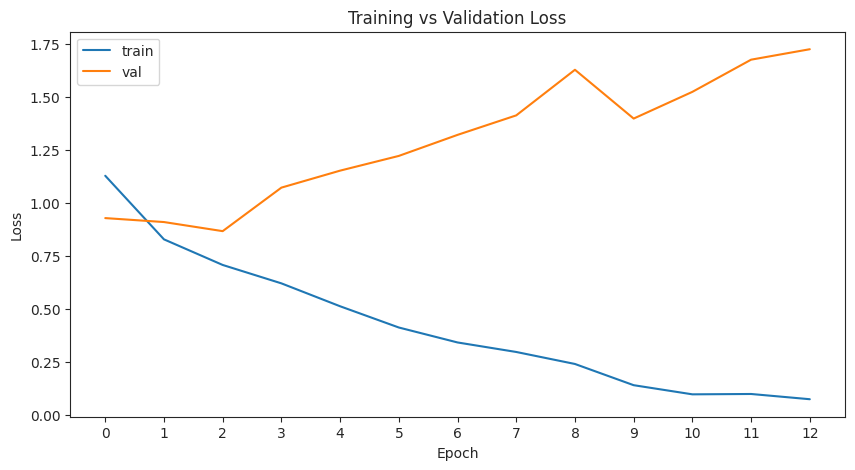

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
10.5 M    Trainable params
683 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.8108


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.95291 (best 0.95291), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=0.95.ckpt' as top 1


Average validation loss for epoch 0: 0.9578
Average training loss for epoch 0: 0.9972


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.86124 (best 0.86124), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=1-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 1: 0.8694
Average training loss for epoch 1: 0.8080


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.82780 (best 0.82780), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=2-val_loss=0.83.ckpt' as top 1


Average validation loss for epoch 2: 0.8337
Average training loss for epoch 2: 0.7161


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.8794
Average training loss for epoch 3: 0.6046


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.1998
Average training loss for epoch 4: 0.5100


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.2329
Average training loss for epoch 5: 0.4217


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.2040
Average training loss for epoch 6: 0.3508


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.3599
Average training loss for epoch 7: 0.2710


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.5102
Average training loss for epoch 8: 0.2183


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.4259
Average training loss for epoch 9: 0.1287


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.4792
Average training loss for epoch 10: 0.0871


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.6412
Average training loss for epoch 11: 0.0694


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.7008
Average training loss for epoch 12: 0.0668


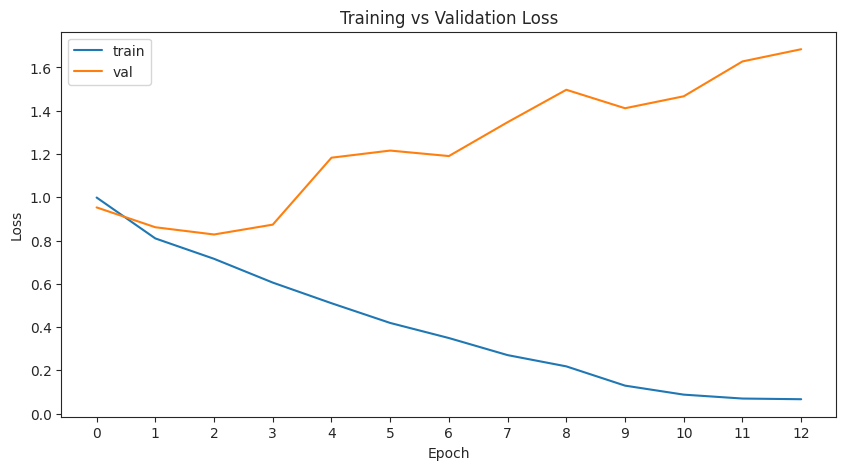

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.0 M    Trainable params
157 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.5493


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.01856 (best 1.01856), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 0: 1.0293
Average training loss for epoch 0: 0.9204


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.91088 (best 0.91088), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=1-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 1: 0.9208
Average training loss for epoch 1: 0.7560


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.9864
Average training loss for epoch 2: 0.6535


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.0492
Average training loss for epoch 3: 0.5565


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.2590
Average training loss for epoch 4: 0.4492


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.1765
Average training loss for epoch 5: 0.3826


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.1557
Average training loss for epoch 6: 0.3031


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.5206
Average training loss for epoch 7: 0.2557


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.4284
Average training loss for epoch 8: 0.1461


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.5290
Average training loss for epoch 9: 0.0992


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.7611
Average training loss for epoch 10: 0.0829


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.7596
Average training loss for epoch 11: 0.0654


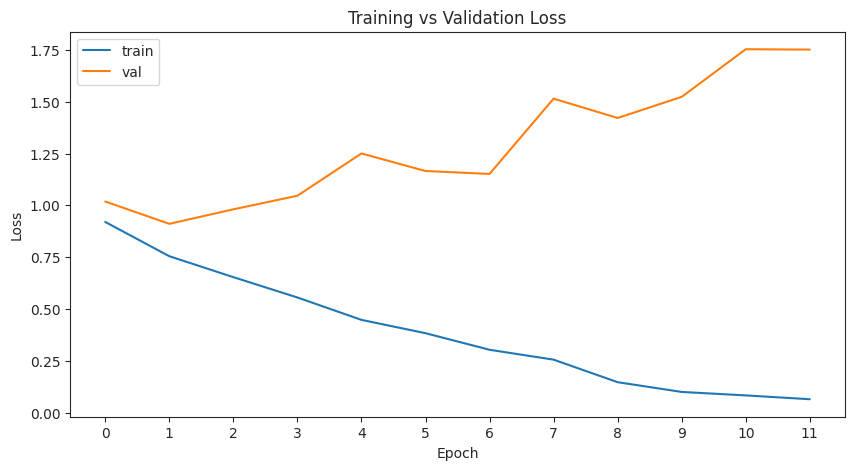

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.5 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3550


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.02343 (best 1.02343), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 0: 1.0292
Average training loss for epoch 0: 0.8414


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 1.0613
Average training loss for epoch 1: 0.6985


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.1013
Average training loss for epoch 2: 0.6235


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.1700
Average training loss for epoch 3: 0.5204


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.2140
Average training loss for epoch 4: 0.4253


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.3393
Average training loss for epoch 5: 0.3821


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.5337
Average training loss for epoch 6: 0.2888


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.4350
Average training loss for epoch 7: 0.1768


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.6106
Average training loss for epoch 8: 0.1214


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.6903
Average training loss for epoch 9: 0.0979


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.8922
Average training loss for epoch 10: 0.0797


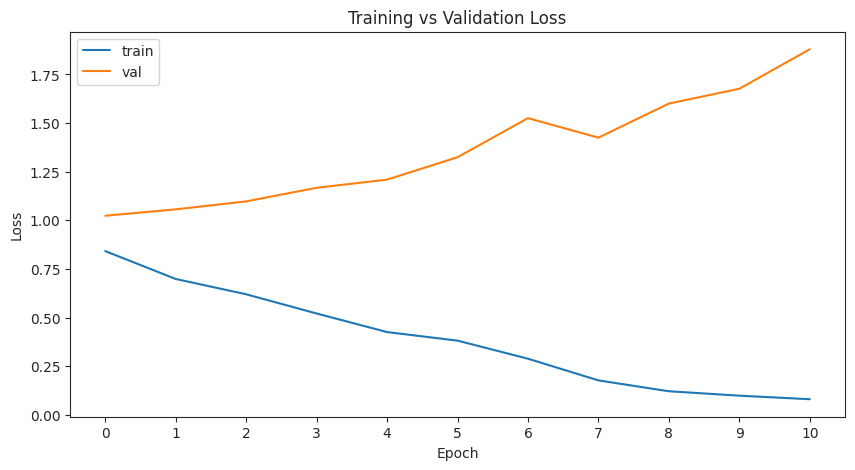

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.4 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.5734


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.01732 (best 1.01732), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=1.02-v1.ckpt' as top 1


Average validation loss for epoch 0: 1.0231
Average training loss for epoch 0: 0.7272


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 1.0476
Average training loss for epoch 1: 0.6176


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.1144
Average training loss for epoch 2: 0.5258


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.2703
Average training loss for epoch 3: 0.4233


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.3350
Average training loss for epoch 4: 0.3737


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.5673
Average training loss for epoch 5: 0.2978


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.5508
Average training loss for epoch 6: 0.2640


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.5862
Average training loss for epoch 7: 0.1409


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.8418
Average training loss for epoch 8: 0.0843


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.9616
Average training loss for epoch 9: 0.0720


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.9900
Average training loss for epoch 10: 0.0633


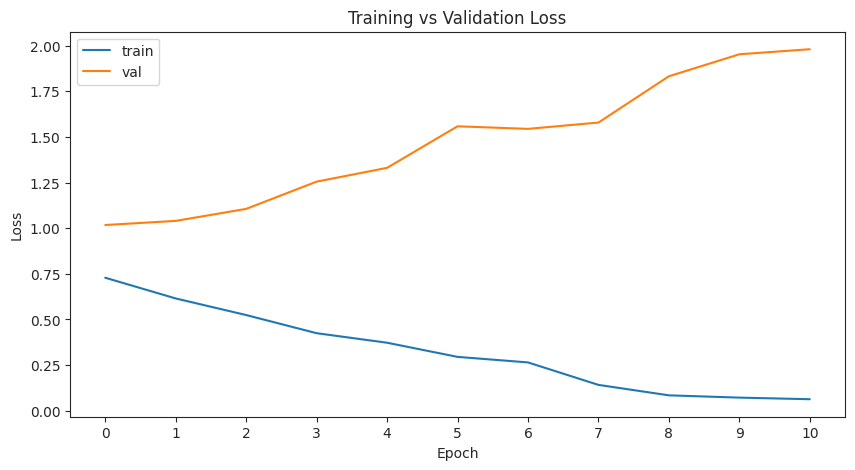

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.9166


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.00383 (best 1.00383), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_photo_aug_dropout_epoch=0-val_loss=1.00.ckpt' as top 1


Average validation loss for epoch 0: 1.0100
Average training loss for epoch 0: 0.6613


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 1.2696
Average training loss for epoch 1: 0.5344


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.4506
Average training loss for epoch 2: 0.4601


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.2726
Average training loss for epoch 3: 0.3816


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.5122
Average training loss for epoch 4: 0.3087


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.6134
Average training loss for epoch 5: 0.2756


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.6119
Average training loss for epoch 6: 0.2278


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.5185
Average training loss for epoch 7: 0.1200


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.6548
Average training loss for epoch 8: 0.0813


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.8040
Average training loss for epoch 9: 0.0645


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.9166
Average training loss for epoch 10: 0.0510


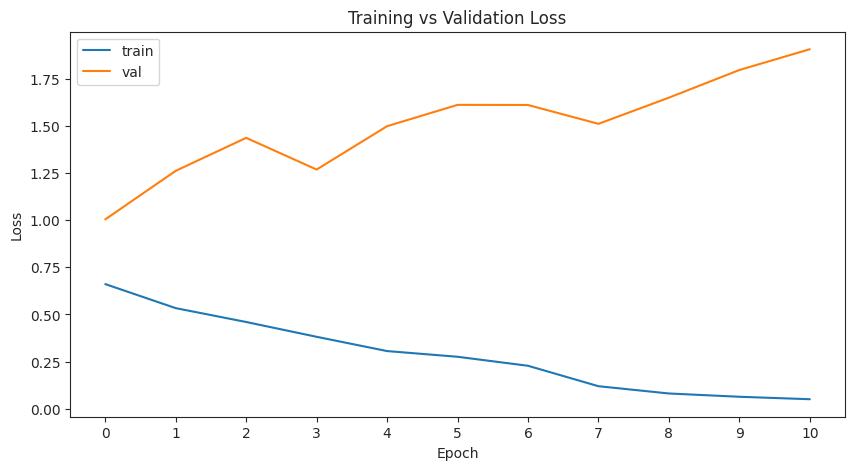

In [53]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()
for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    # Setup each subset
    #data_module.subset_idx = iteration 

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_photo_aug_dropout"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:

        # Aplicar a todos los bloques
        for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
            layer = getattr(model, layer_name)
            for block in layer:
                add_dropout_to_basicblock(block, p=0.2)
        
        # Cambiar última capa
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_photo_aug_dropout_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

Generating predictions...
F1 Score (macro): 0.5858
Confusion matrix saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/figures/cassava_resnet18_gradual_unfreezing_photo_aug_dropout_CM.pdf


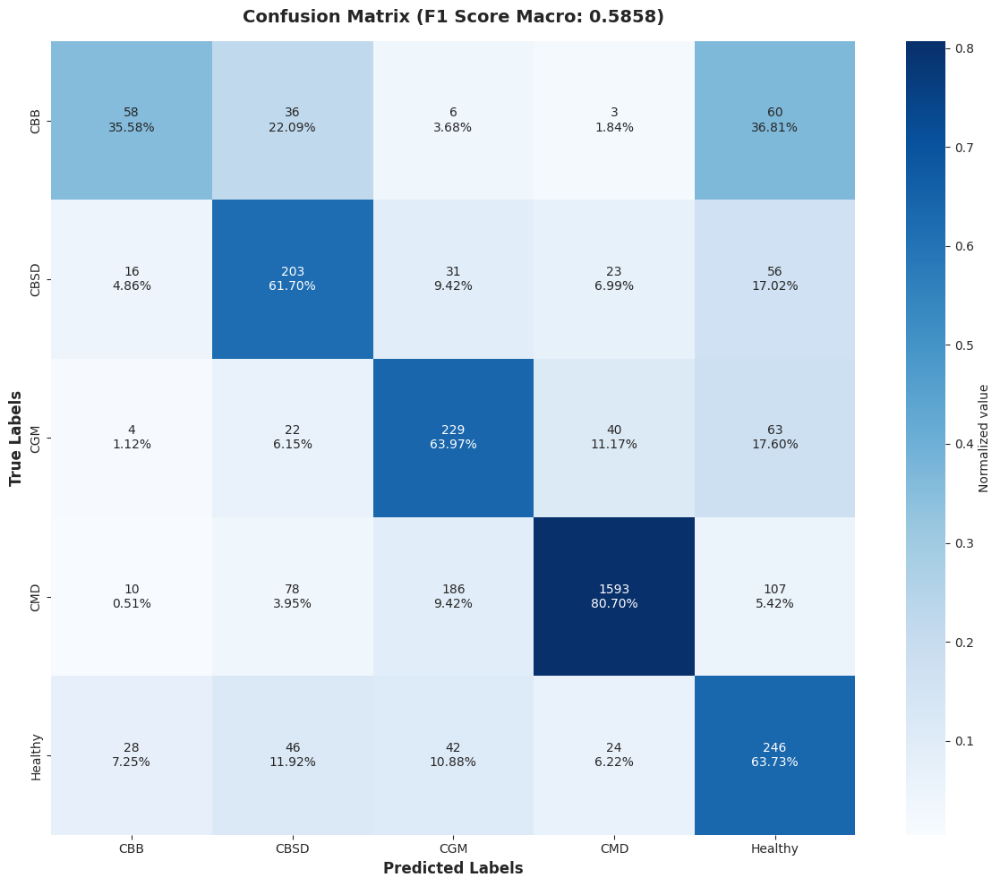

In [54]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_photo_aug_dropout_CM.pdf')
)

## Experiment 3: Geometric + Photometric Augmentations

### Variables Setup

In [48]:
prob = {
    'horizontal_flip': 0.1,
    'vertical_flip': 0.1,
    'resized_crop': 0.2,
    'rotation': 0.2,
    'affine_trans': 0.2,
    'color_jitter': 0.5,
    'gauss_blur': 0.1,
    'gauss_noise': 0.1,
}
data_transforms = {
    'train': T.Compose([
        T.Resize(size=256, interpolation=InterpolationMode.BILINEAR),
        T.RandomApply([T.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.025)], p=prob['color_jitter']),
        T.RandomApply([T.GaussianBlur(kernel_size=(3,3), sigma=(0.1, 2.0))], p=prob['gauss_blur']),
        T.RandomHorizontalFlip(p=prob['horizontal_flip']),
        T.RandomVerticalFlip(p=prob['vertical_flip']),
        T.RandomApply([T.RandomResizedCrop(size=256, scale=(0.5, 1.0), ratio=(0.75, 1.33))], p=prob['resized_crop']),
        T.RandomApply([T.RandomRotation(degrees=(-90, 90))], p=prob['rotation']),
        T.RandomApply([T.RandomAffine(degrees=(0, 0), translate=(0.25, 0.25))], p=prob['affine_trans']),
        T.CenterCrop(256),
        T.ToTensor(),
        T.RandomApply([GaussianNoise()], p=prob['gauss_noise']),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

### Training Loop

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
2.6 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0477


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 1.19959 (best 1.19959), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.20.ckpt' as top 1


Average validation loss for epoch 0: 1.1987
Average training loss for epoch 0: 1.3531


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 1.08068 (best 1.08068), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=1.08.ckpt' as top 1


Average validation loss for epoch 1: 1.0817
Average training loss for epoch 1: 1.1566


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 1.04165 (best 1.04165), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=1.04.ckpt' as top 1


Average validation loss for epoch 2: 1.0449
Average training loss for epoch 2: 1.1053


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 1.03032 (best 1.03032), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 3: 1.0343
Average training loss for epoch 3: 1.0622


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' reached 1.02987 (best 1.02987), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=4-val_loss=1.03.ckpt' as top 1


Average validation loss for epoch 4: 1.0341
Average training loss for epoch 4: 1.0470


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 1.02279 (best 1.02279), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 5: 1.0246
Average training loss for epoch 5: 1.0543


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0326
Average training loss for epoch 6: 1.0255


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0279
Average training loss for epoch 7: 1.0406


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0276
Average training loss for epoch 8: 1.0408


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0309
Average training loss for epoch 9: 1.0287


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' reached 1.01122 (best 1.01122), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=10-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 10: 1.0142
Average training loss for epoch 10: 1.0036


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' reached 1.01088 (best 1.01088), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=11-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 11: 1.0143
Average training loss for epoch 11: 1.0038


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' reached 1.00968 (best 1.00968), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=12-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 12: 1.0132
Average training loss for epoch 12: 0.9947


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.0152
Average training loss for epoch 13: 1.0076


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.0137
Average training loss for epoch 14: 1.0105


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' reached 1.00742 (best 1.00742), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=15-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 15: 1.0109
Average training loss for epoch 15: 0.9966


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 1.0137
Average training loss for epoch 16: 0.9963


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.0149
Average training loss for epoch 17: 0.9919


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.0116
Average training loss for epoch 18: 1.0038


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2440: 'val_loss' was not in top 1


Average validation loss for epoch 19: 1.0129
Average training loss for epoch 19: 0.9945


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 2562: 'val_loss' was not in top 1


Average validation loss for epoch 20: 1.0139
Average training loss for epoch 20: 0.9968


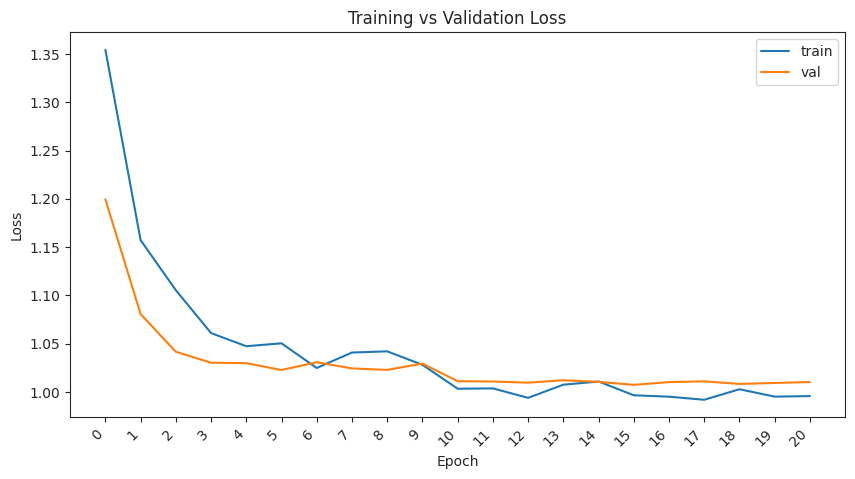

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
8.4 M     Trainable params
2.8 M     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.6691


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.91908 (best 0.91908), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 0: 0.9241
Average training loss for epoch 0: 1.1675


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.87192 (best 0.87192), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.87.ckpt' as top 1


Average validation loss for epoch 1: 0.8806
Average training loss for epoch 1: 0.9102


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.83877 (best 0.83877), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=0.84.ckpt' as top 1


Average validation loss for epoch 2: 0.8449
Average training loss for epoch 2: 0.8444


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9848
Average training loss for epoch 3: 0.8015


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8603
Average training loss for epoch 4: 0.7421


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8867
Average training loss for epoch 5: 0.7155


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.8999
Average training loss for epoch 6: 0.6843


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8697
Average training loss for epoch 7: 0.6578


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8839
Average training loss for epoch 8: 0.6273


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9006
Average training loss for epoch 9: 0.5154


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9143
Average training loss for epoch 10: 0.4909


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9523
Average training loss for epoch 11: 0.4671


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9621
Average training loss for epoch 12: 0.4599


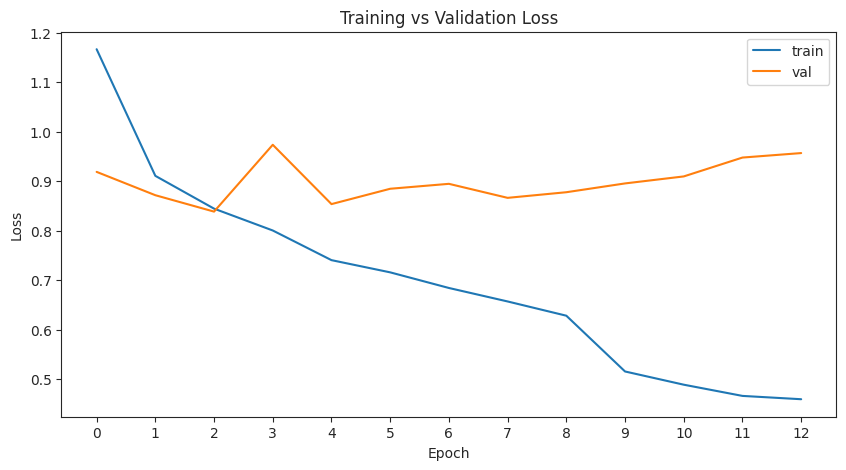

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
10.5 M    Trainable params
683 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.5459


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.81499 (best 0.81499), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.81.ckpt' as top 1


Average validation loss for epoch 0: 0.8197
Average training loss for epoch 0: 1.0339


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.80388 (best 0.80388), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.80.ckpt' as top 1


Average validation loss for epoch 1: 0.8094
Average training loss for epoch 1: 0.8953


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8560
Average training loss for epoch 2: 0.8246


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.77852 (best 0.77852), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.78.ckpt' as top 1


Average validation loss for epoch 3: 0.7875
Average training loss for epoch 3: 0.7938


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.7878
Average training loss for epoch 4: 0.7548


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 0.75475 (best 0.75475), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=0.75.ckpt' as top 1


Average validation loss for epoch 5: 0.7593
Average training loss for epoch 5: 0.7379


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' reached 0.75130 (best 0.75130), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=6-val_loss=0.75.ckpt' as top 1


Average validation loss for epoch 6: 0.7596
Average training loss for epoch 6: 0.6977


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' reached 0.75101 (best 0.75101), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=7-val_loss=0.75.ckpt' as top 1


Average validation loss for epoch 7: 0.7592
Average training loss for epoch 7: 0.6831


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.7615
Average training loss for epoch 8: 0.6510


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.8381
Average training loss for epoch 9: 0.6390


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.7879
Average training loss for epoch 10: 0.6342


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.7965
Average training loss for epoch 11: 0.5914


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.7892
Average training loss for epoch 12: 0.5099


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.7985
Average training loss for epoch 13: 0.4788


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.8163
Average training loss for epoch 14: 0.4675


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.8234
Average training loss for epoch 15: 0.4506


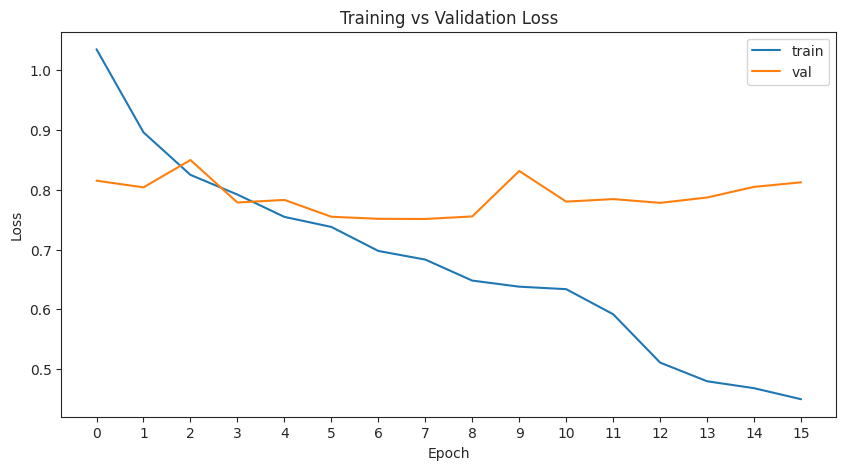

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.0 M    Trainable params
157 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3670


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.79449 (best 0.79449), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.79.ckpt' as top 1


Average validation loss for epoch 0: 0.8010
Average training loss for epoch 0: 0.9279


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 0.8532
Average training loss for epoch 1: 0.8257


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8299
Average training loss for epoch 2: 0.7737


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.78695 (best 0.78695), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.79.ckpt' as top 1


Average validation loss for epoch 3: 0.7945
Average training loss for epoch 3: 0.7553


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8622
Average training loss for epoch 4: 0.7153


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' reached 0.78466 (best 0.78466), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=0.78.ckpt' as top 1


Average validation loss for epoch 5: 0.7933
Average training loss for epoch 5: 0.6945


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' reached 0.76478 (best 0.76478), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=6-val_loss=0.76.ckpt' as top 1


Average validation loss for epoch 6: 0.7718
Average training loss for epoch 6: 0.6668


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8069
Average training loss for epoch 7: 0.6439


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8053
Average training loss for epoch 8: 0.6369


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9008
Average training loss for epoch 9: 0.6178


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.8557
Average training loss for epoch 10: 0.5901


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9029
Average training loss for epoch 11: 0.5801


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.8825
Average training loss for epoch 12: 0.5599


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.8127
Average training loss for epoch 13: 0.4999


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.8569
Average training loss for epoch 14: 0.4585


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.8368
Average training loss for epoch 15: 0.4425


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.8519
Average training loss for epoch 16: 0.4202


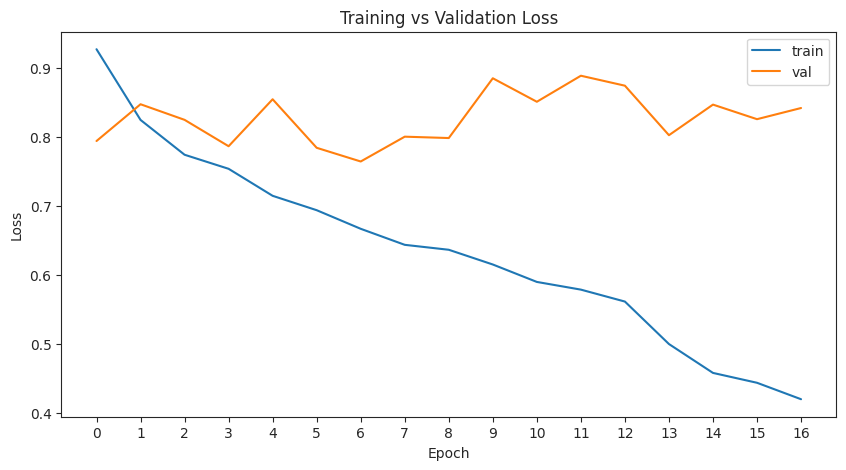

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.5 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.3825


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.89045 (best 0.89045), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.89.ckpt' as top 1


Average validation loss for epoch 0: 0.8969
Average training loss for epoch 0: 0.8109


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.83089 (best 0.83089), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.83.ckpt' as top 1


Average validation loss for epoch 1: 0.8350
Average training loss for epoch 1: 0.7585


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8894
Average training loss for epoch 2: 0.7271


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.8574
Average training loss for epoch 3: 0.6875


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8831
Average training loss for epoch 4: 0.6923


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8913
Average training loss for epoch 5: 0.6633


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.9356
Average training loss for epoch 6: 0.6304


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8655
Average training loss for epoch 7: 0.6328


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' reached 0.78897 (best 0.78897), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=8-val_loss=0.79.ckpt' as top 1


Average validation loss for epoch 8: 0.7992
Average training loss for epoch 8: 0.5291


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.8183
Average training loss for epoch 9: 0.5038


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.8096
Average training loss for epoch 10: 0.4922


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8296
Average training loss for epoch 11: 0.4785


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.8431
Average training loss for epoch 12: 0.4605


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.8802
Average training loss for epoch 13: 0.4424


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.8508
Average training loss for epoch 14: 0.4484


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.8557
Average training loss for epoch 15: 0.4334


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.8521
Average training loss for epoch 16: 0.4377


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 0.8577
Average training loss for epoch 17: 0.4407


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 0.8582
Average training loss for epoch 18: 0.4442


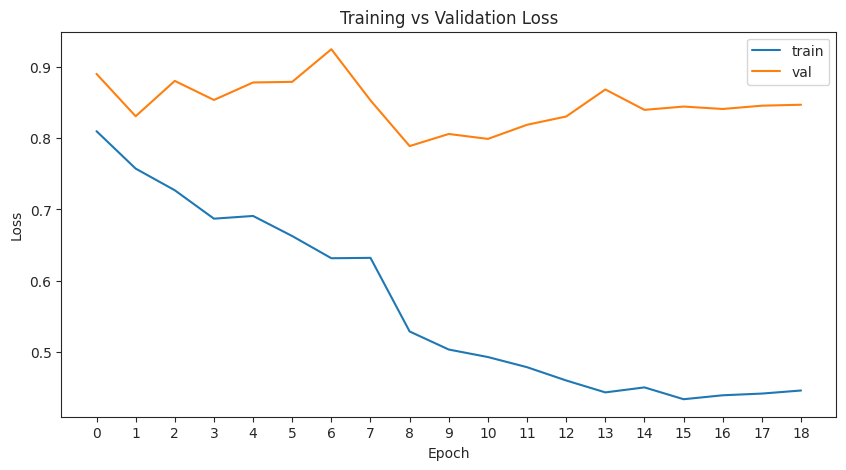

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.4 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.4199


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.98773 (best 0.98773), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.99.ckpt' as top 1


Average validation loss for epoch 0: 0.9960
Average training loss for epoch 0: 0.6172


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' reached 0.97501 (best 0.97501), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.98.ckpt' as top 1


Average validation loss for epoch 1: 0.9827
Average training loss for epoch 1: 0.5965


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.91348 (best 0.91348), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 2: 0.9203
Average training loss for epoch 2: 0.5881


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.85965 (best 0.85965), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 3: 0.8683
Average training loss for epoch 3: 0.5682


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9306
Average training loss for epoch 4: 0.5694


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 0.8748
Average training loss for epoch 5: 0.5472


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0093
Average training loss for epoch 6: 0.5474


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9144
Average training loss for epoch 7: 0.5556


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8764
Average training loss for epoch 8: 0.5298


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0215
Average training loss for epoch 9: 0.5015


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9030
Average training loss for epoch 10: 0.4532


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8998
Average training loss for epoch 11: 0.4165


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9445
Average training loss for epoch 12: 0.4044


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.9365
Average training loss for epoch 13: 0.3893


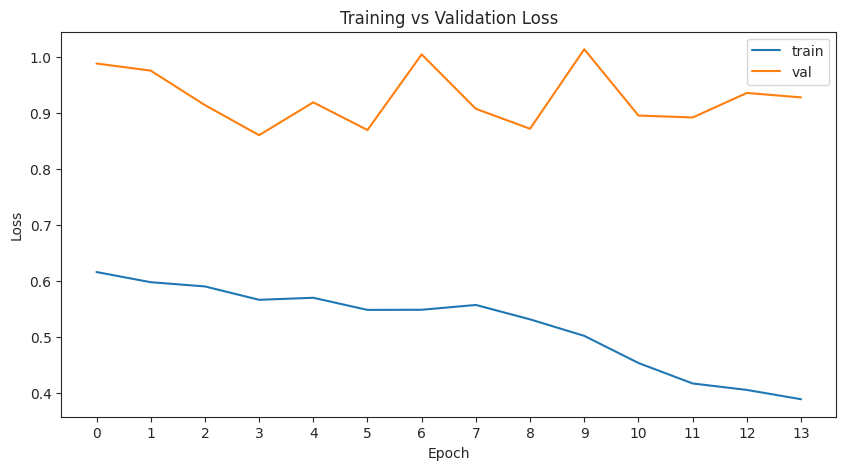

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.4413


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 122: 'val_loss' reached 0.93707 (best 0.93707), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.94.ckpt' as top 1


Average validation loss for epoch 0: 0.9455
Average training loss for epoch 0: 0.6086


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 244: 'val_loss' was not in top 1


Average validation loss for epoch 1: 0.9728
Average training loss for epoch 1: 0.5671


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 366: 'val_loss' reached 0.92501 (best 0.92501), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=0.93.ckpt' as top 1


Average validation loss for epoch 2: 0.9320
Average training loss for epoch 2: 0.5489


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 488: 'val_loss' reached 0.88341 (best 0.88341), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.88.ckpt' as top 1


Average validation loss for epoch 3: 0.8917
Average training loss for epoch 3: 0.5460


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 610: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.0503
Average training loss for epoch 4: 0.5345


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 732: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.0547
Average training loss for epoch 5: 0.5298


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 854: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.9437
Average training loss for epoch 6: 0.5277


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 976: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9686
Average training loss for epoch 7: 0.5096


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1098: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.0625
Average training loss for epoch 8: 0.4974


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1220: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0048
Average training loss for epoch 9: 0.4946


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1342: 'val_loss' reached 0.85424 (best 0.85424), saving model to '/home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=10-val_loss=0.85.ckpt' as top 1


Average validation loss for epoch 10: 0.8640
Average training loss for epoch 10: 0.4314


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 1464: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9073
Average training loss for epoch 11: 0.3994


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1586: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9217
Average training loss for epoch 12: 0.3906


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1708: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.9306
Average training loss for epoch 13: 0.3756


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 1830: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.9306
Average training loss for epoch 14: 0.3659


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 1952: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.9137
Average training loss for epoch 15: 0.3815


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 2074: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.9325
Average training loss for epoch 16: 0.3507


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2196: 'val_loss' was not in top 1


Average validation loss for epoch 17: 0.9413
Average training loss for epoch 17: 0.3660


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2318: 'val_loss' was not in top 1


Average validation loss for epoch 18: 0.9444
Average training loss for epoch 18: 0.3584


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2440: 'val_loss' was not in top 1


Average validation loss for epoch 19: 0.9201
Average training loss for epoch 19: 0.3623


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 2562: 'val_loss' was not in top 1


Average validation loss for epoch 20: 0.9261
Average training loss for epoch 20: 0.3560


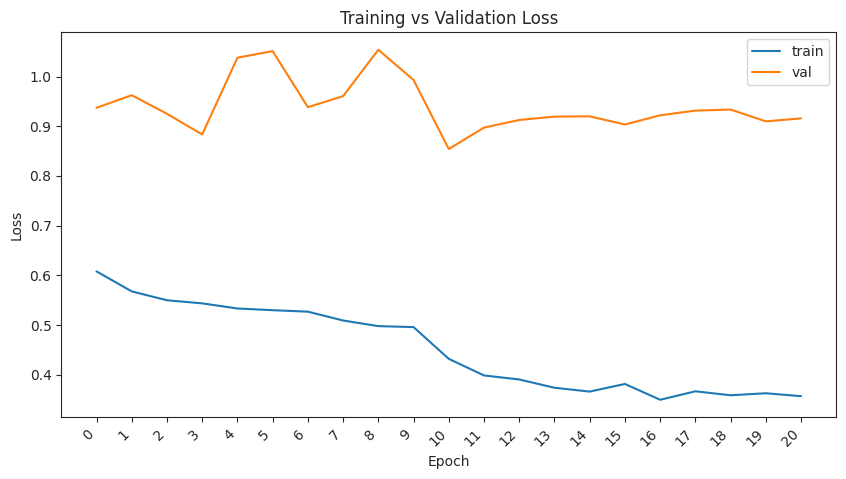

In [49]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()
for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    # Setup each subset
    #data_module.subset_idx = iteration 

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_geo_photo_aug_dropout"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:

        # Aplicar a todos los bloques
        for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
            layer = getattr(model, layer_name)
            for block in layer:
                add_dropout_to_basicblock(block, p=0.2)
        
        # Cambiar última capa
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_geo_photo_aug_dropout_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

Generating predictions...
F1 Score (macro): 0.7017
Confusion matrix saved to /home/alumno/Desktop/datos/Computer Vision/Assignment 02/cassava/figures/cassava_resnet18_gradual_unfreezing_geo_photo_aug_dropout_CM.pdf


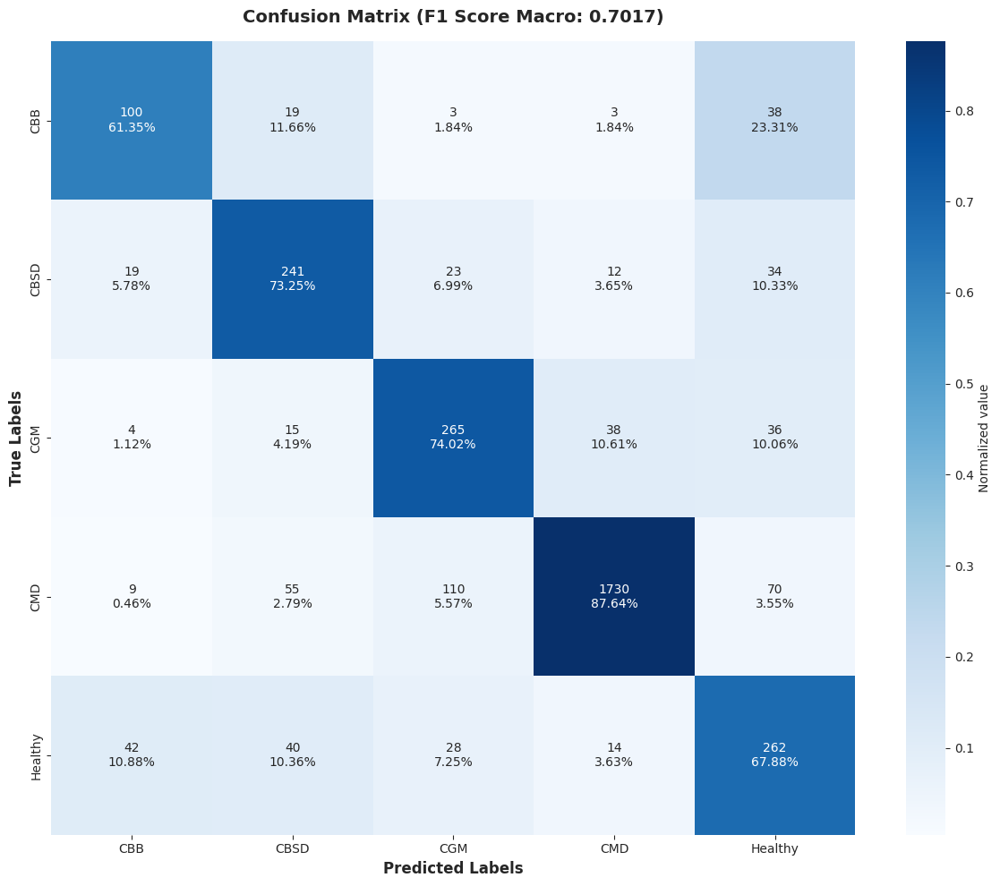

In [50]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_geo_photo_aug_dropout_CM.pdf')
)

## Expriment 3 bis: Geometric + Photometric Augs. with train and eval subsets

### DataModule modification

In [11]:
class DataModule(pl.LightningDataModule):
    def __init__(self, data_dir='cassava', batch_size=64, num_workers=2, num_subsets=7, transforms=None):
        super().__init__()
        self.save_hyperparameters()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.num_subsets = num_subsets
        self.subset_idx = 0
        
        if transforms is None:
            # Aquí deberías tener definido tu diccionario de transforms
            # Por ejemplo, el que definiste anteriormente en tu código
            self.transforms = {
                'train': ResNet18_Weights.IMAGENET1K_V1.transforms(),
                'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
                'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
            }
        else:
            self.transforms = transforms
        
    def setup(self, stage=None):
        images_dir = os.path.join(self.data_dir, 'images')
        
        # Rutas a los archivos
        csv_file = os.path.join(self.data_dir, 'cassava_split.csv')
        label_map_file = os.path.join(self.data_dir, 'label_num_to_disease_map.json')
        
        # Preparar transforms
        #transform = ResNet18_Weights.IMAGENET1K_V1.transforms()
        
        # Crear datasets con el subset_idx ACTUAL
        self.train_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='train',
            num_subsets=self.num_subsets,
            subset_idx=self.subset_idx,
            transform=self.transforms['train']
        )
        
        self.val_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='val',
            num_subsets=self.num_subsets,
            subset_idx=self.subset_idx,
            transform=self.transforms['val']
        )
        
        self.test_ds = CassavaDataset(
            csv_file=csv_file,
            images_dir=images_dir,
            label_map_file=label_map_file,
            set_name='test',
            num_subsets=1,
            subset_idx=0,
            transform=self.transforms['test']
        )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers,
            shuffle=True
        )
    
    def val_dataloader(self):
        return DataLoader(
            self.val_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_ds, 
            batch_size=self.batch_size, 
            num_workers=self.num_workers
        )

### Variables Setup

In [13]:
class GaussianNoise:
    def __init__(self, mean=0., std=0.1):
        self.mean = mean
        self.std = std
    
    def __call__(self, img):
        noise = torch.randn(img.size()) * self.std + self.mean
        return img + noise
    
    def __repr__(self):
        return f"{self.__class__.__name__}(mean={self.mean}, std={self.std})"

In [16]:
def add_dropout_to_basicblock(block, p=0.2):
    original_forward = block.forward
    
    def new_forward(x):
        identity = x
        
        out = block.conv1(x)
        out = block.bn1(out)
        out = block.relu(out)
        
        # Solo aplicar dropout si algún parámetro del bloque requiere gradientes
        if any(p.requires_grad for p in block.parameters()):
            out = nn.functional.dropout2d(out, p=p, training=block.training)
        
        out = block.conv2(out)
        out = block.bn2(out)
        
        if block.downsample is not None:
            identity = block.downsample(x)
        
        out += identity
        out = block.relu(out)
        
        return out
    
    block.forward = new_forward
    return block

In [14]:
prob = {
    'horizontal_flip': 0.1,
    'vertical_flip': 0.1,
    'resized_crop': 0.2,
    'rotation': 0.2,
    'affine_trans': 0.2,
    'color_jitter': 0.5,
    'gauss_blur': 0.1,
    'gauss_noise': 0.1,
}
data_transforms = {
    'train': T.Compose([
        T.Resize(size=256, interpolation=InterpolationMode.BILINEAR),
        T.RandomApply([T.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.025)], p=prob['color_jitter']),
        T.RandomApply([T.GaussianBlur(kernel_size=(3,3), sigma=(0.1, 2.0))], p=prob['gauss_blur']),
        T.RandomHorizontalFlip(p=prob['horizontal_flip']),
        T.RandomVerticalFlip(p=prob['vertical_flip']),
        T.RandomApply([T.RandomResizedCrop(size=256, scale=(0.5, 1.0), ratio=(0.75, 1.33))], p=prob['resized_crop']),
        T.RandomApply([T.RandomRotation(degrees=(-90, 90))], p=prob['rotation']),
        T.RandomApply([T.RandomAffine(degrees=(0, 0), translate=(0.25, 0.25))], p=prob['affine_trans']),
        T.CenterCrop(256),
        T.ToTensor(),
        T.RandomApply([GaussianNoise()], p=prob['gauss_noise']),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

### Setup

In [17]:
# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')

# Extraer nombres de parámetros y grupos en una sola pasada
layer_names = []
group_names = []
for idx, (name, param) in enumerate(model.named_parameters()):
    layer_names.append(name)
    group_names.append(name.split('.')[0])
    print(f'{idx}: {name}')

# Encontrar índices únicos de grupos en orden inverso
seen = {}
freeze_until_idx = []
for idx, group_name in enumerate(group_names):
    if group_name not in seen:
        seen[group_name] = idx
        freeze_until_idx.append(idx)

freeze_until_idx = freeze_until_idx[::-1]
print(freeze_until_idx)

Seed set to 42


0: conv1.weight
1: bn1.weight
2: bn1.bias
3: layer1.0.conv1.weight
4: layer1.0.bn1.weight
5: layer1.0.bn1.bias
6: layer1.0.conv2.weight
7: layer1.0.bn2.weight
8: layer1.0.bn2.bias
9: layer1.1.conv1.weight
10: layer1.1.bn1.weight
11: layer1.1.bn1.bias
12: layer1.1.conv2.weight
13: layer1.1.bn2.weight
14: layer1.1.bn2.bias
15: layer2.0.conv1.weight
16: layer2.0.bn1.weight
17: layer2.0.bn1.bias
18: layer2.0.conv2.weight
19: layer2.0.bn2.weight
20: layer2.0.bn2.bias
21: layer2.0.downsample.0.weight
22: layer2.0.downsample.1.weight
23: layer2.0.downsample.1.bias
24: layer2.1.conv1.weight
25: layer2.1.bn1.weight
26: layer2.1.bn1.bias
27: layer2.1.conv2.weight
28: layer2.1.bn2.weight
29: layer2.1.bn2.bias
30: layer3.0.conv1.weight
31: layer3.0.bn1.weight
32: layer3.0.bn1.bias
33: layer3.0.conv2.weight
34: layer3.0.bn2.weight
35: layer3.0.bn2.bias
36: layer3.0.downsample.0.weight
37: layer3.0.downsample.1.weight
38: layer3.0.downsample.1.bias
39: layer3.1.conv1.weight
40: layer3.1.bn1.weight
4

### Training Loop

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA RTX PRO 6000 Blackwell Max-Q Workstation Edition') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
2.6 K     Trainable params
11.2 M    Non-tr

Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.7750


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.57298 (best 1.57298), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.57.ckpt' as top 1


Average validation loss for epoch 0: 1.5703
Average training loss for epoch 0: 1.5792


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 1.48181 (best 1.48181), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=1.48.ckpt' as top 1


Average validation loss for epoch 1: 1.4810
Average training loss for epoch 1: 1.4062


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' reached 1.34386 (best 1.34386), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=1.34.ckpt' as top 1


Average validation loss for epoch 2: 1.3440
Average training loss for epoch 2: 1.3152


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' reached 1.31902 (best 1.31902), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=1.32.ckpt' as top 1


Average validation loss for epoch 3: 1.3237
Average training loss for epoch 3: 1.2295


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' reached 1.21180 (best 1.21180), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=4-val_loss=1.21.ckpt' as top 1


Average validation loss for epoch 4: 1.2129
Average training loss for epoch 4: 1.2010


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' reached 1.20005 (best 1.20005), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=1.20.ckpt' as top 1


Average validation loss for epoch 5: 1.1993
Average training loss for epoch 5: 1.1768


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' reached 1.18673 (best 1.18673), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=6-val_loss=1.19.ckpt' as top 1


Average validation loss for epoch 6: 1.1856
Average training loss for epoch 6: 1.1498


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' reached 1.15672 (best 1.15672), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=7-val_loss=1.16.ckpt' as top 1


Average validation loss for epoch 7: 1.1569
Average training loss for epoch 7: 1.1379


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.1585
Average training loss for epoch 8: 1.0690


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' reached 1.14624 (best 1.14624), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=9-val_loss=1.15.ckpt' as top 1


Average validation loss for epoch 9: 1.1449
Average training loss for epoch 9: 1.0661


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1575
Average training loss for epoch 10: 1.0413


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' reached 1.14285 (best 1.14285), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=11-val_loss=1.14.ckpt' as top 1


Average validation loss for epoch 11: 1.1433
Average training loss for epoch 11: 1.0400


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.1529
Average training loss for epoch 12: 1.0465


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' reached 1.14207 (best 1.14207), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=13-val_loss=1.14.ckpt' as top 1


Average validation loss for epoch 13: 1.1408
Average training loss for epoch 13: 1.0372


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' was not in top 1


Average validation loss for epoch 14: 1.1439
Average training loss for epoch 14: 1.0533


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' reached 1.13067 (best 1.13067), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=15-val_loss=1.13.ckpt' as top 1


Average validation loss for epoch 15: 1.1276
Average training loss for epoch 15: 1.0023


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 306: 'val_loss' was not in top 1


Average validation loss for epoch 16: 1.1564
Average training loss for epoch 16: 1.0125


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 324: 'val_loss' was not in top 1


Average validation loss for epoch 17: 1.1402
Average training loss for epoch 17: 0.9886


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 342: 'val_loss' was not in top 1


Average validation loss for epoch 18: 1.1489
Average training loss for epoch 18: 1.0133


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 360: 'val_loss' was not in top 1


Average validation loss for epoch 19: 1.1812
Average training loss for epoch 19: 1.0050


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 378: 'val_loss' was not in top 1


Average validation loss for epoch 20: 1.1444
Average training loss for epoch 20: 0.9660


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 396: 'val_loss' was not in top 1


Average validation loss for epoch 21: 1.1403
Average training loss for epoch 21: 0.9624


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 414: 'val_loss' was not in top 1


Average validation loss for epoch 22: 1.1295
Average training loss for epoch 22: 0.9647


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 23, global step 432: 'val_loss' reached 1.12897 (best 1.12897), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=23-val_loss=1.13.ckpt' as top 1


Average validation loss for epoch 23: 1.1251
Average training loss for epoch 23: 0.9512


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 24, global step 450: 'val_loss' was not in top 1


Average validation loss for epoch 24: 1.1306
Average training loss for epoch 24: 0.9338


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 25, global step 468: 'val_loss' reached 1.12540 (best 1.12540), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=25-val_loss=1.13.ckpt' as top 1


Average validation loss for epoch 25: 1.1222
Average training loss for epoch 25: 0.9730


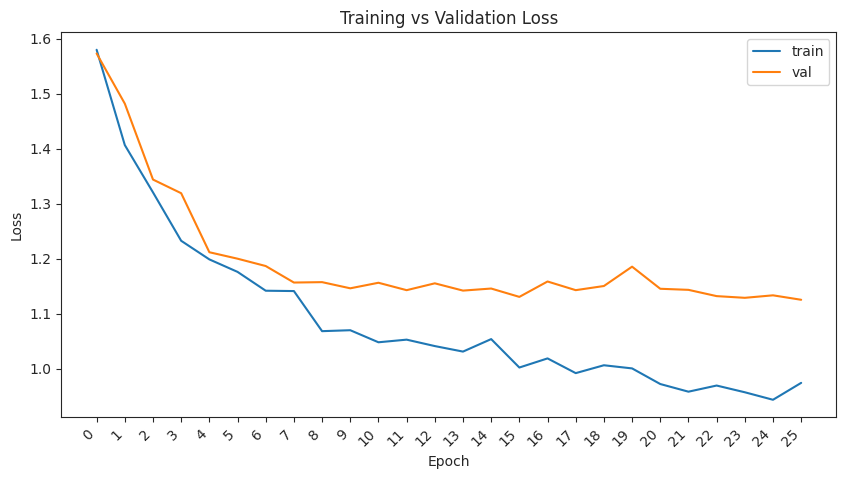

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
8.4 M     Trainable params
2.8 M     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.9861


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.87347 (best 1.87347), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.87.ckpt' as top 1


Average validation loss for epoch 0: 1.8550
Average training loss for epoch 0: 1.5259


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 1.09721 (best 1.09721), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=1.10.ckpt' as top 1


Average validation loss for epoch 1: 1.0882
Average training loss for epoch 1: 1.0798


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' reached 1.00936 (best 1.00936), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=1.01.ckpt' as top 1


Average validation loss for epoch 2: 1.0009
Average training loss for epoch 2: 0.8472


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.0127
Average training loss for epoch 3: 0.7316


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.3842
Average training loss for epoch 4: 0.6904


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.2245
Average training loss for epoch 5: 0.6214


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.4122
Average training loss for epoch 6: 0.5400


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.2816
Average training loss for epoch 7: 0.5257


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.3253
Average training loss for epoch 8: 0.4614


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.1054
Average training loss for epoch 9: 0.4334


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1481
Average training loss for epoch 10: 0.3815


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 1.1616
Average training loss for epoch 11: 0.3971


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.1251
Average training loss for epoch 12: 0.3551


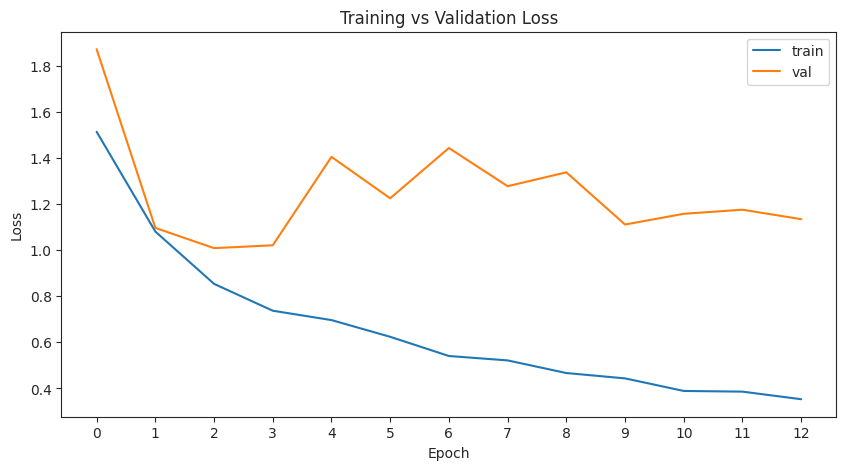

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
10.5 M    Trainable params
683 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.9727


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.37615 (best 1.37615), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.38.ckpt' as top 1


Average validation loss for epoch 0: 1.3729
Average training loss for epoch 0: 1.2789


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 1.13342 (best 1.13342), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=1.13.ckpt' as top 1


Average validation loss for epoch 1: 1.1189
Average training loss for epoch 1: 1.1734


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.2725
Average training loss for epoch 2: 1.0680


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' reached 0.96955 (best 0.96955), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.97.ckpt' as top 1


Average validation loss for epoch 3: 0.9717
Average training loss for epoch 3: 0.9749


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.0808
Average training loss for epoch 4: 0.9141


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.0400
Average training loss for epoch 5: 0.8672


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.0722
Average training loss for epoch 6: 0.8333


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' reached 0.88858 (best 0.88858), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=7-val_loss=0.89.ckpt' as top 1


Average validation loss for epoch 7: 0.8912
Average training loss for epoch 7: 0.7873


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 1.1800
Average training loss for epoch 8: 0.7317


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0337
Average training loss for epoch 9: 0.6931


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1512
Average training loss for epoch 10: 0.7238


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.8944
Average training loss for epoch 11: 0.7084


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.2953
Average training loss for epoch 12: 0.6625


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' was not in top 1


Average validation loss for epoch 13: 1.2504
Average training loss for epoch 13: 0.6349


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.9400
Average training loss for epoch 14: 0.5652


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' reached 0.87023 (best 0.87023), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=15-val_loss=0.87.ckpt' as top 1


Average validation loss for epoch 15: 0.8748
Average training loss for epoch 15: 0.5426


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 306: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.8942
Average training loss for epoch 16: 0.4702


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 324: 'val_loss' was not in top 1


Average validation loss for epoch 17: 0.9261
Average training loss for epoch 17: 0.4792


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 342: 'val_loss' was not in top 1


Average validation loss for epoch 18: 0.9373
Average training loss for epoch 18: 0.4843


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 360: 'val_loss' was not in top 1


Average validation loss for epoch 19: 0.9567
Average training loss for epoch 19: 0.4576


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 378: 'val_loss' was not in top 1


Average validation loss for epoch 20: 0.9674
Average training loss for epoch 20: 0.4614


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 396: 'val_loss' was not in top 1


Average validation loss for epoch 21: 0.9463
Average training loss for epoch 21: 0.4172


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 414: 'val_loss' was not in top 1


Average validation loss for epoch 22: 0.9478
Average training loss for epoch 22: 0.4310


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 23, global step 432: 'val_loss' was not in top 1


Average validation loss for epoch 23: 0.9597
Average training loss for epoch 23: 0.4346


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 24, global step 450: 'val_loss' was not in top 1


Average validation loss for epoch 24: 0.9642
Average training loss for epoch 24: 0.4121


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 25, global step 468: 'val_loss' was not in top 1


Average validation loss for epoch 25: 0.9607
Average training loss for epoch 25: 0.4096


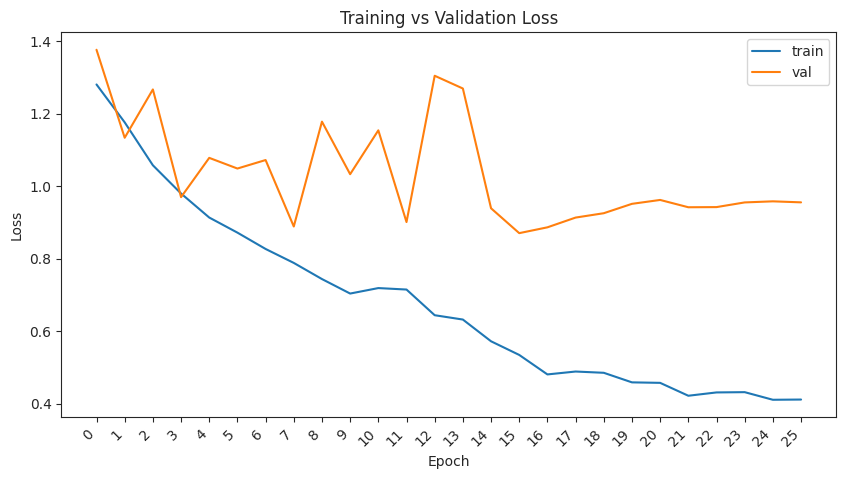

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.0 M    Trainable params
157 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.8658


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.06002 (best 1.06002), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.06.ckpt' as top 1


Average validation loss for epoch 0: 1.0703
Average training loss for epoch 0: 1.3313


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 0.98179 (best 0.98179), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.98.ckpt' as top 1


Average validation loss for epoch 1: 0.9765
Average training loss for epoch 1: 1.1054


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' reached 0.92680 (best 0.92680), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=2-val_loss=0.93.ckpt' as top 1


Average validation loss for epoch 2: 0.9247
Average training loss for epoch 2: 1.0343


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.9349
Average training loss for epoch 3: 1.0215


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.9905
Average training loss for epoch 4: 0.9717


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' reached 0.90541 (best 0.90541), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 5: 0.8976
Average training loss for epoch 5: 0.9365


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' reached 0.85826 (best 0.85826), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=6-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 6: 0.8479
Average training loss for epoch 6: 0.8486


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.9423
Average training loss for epoch 7: 0.8706


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8806
Average training loss for epoch 8: 0.7921


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' was not in top 1


Average validation loss for epoch 9: 1.0146
Average training loss for epoch 9: 0.8000


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.0326
Average training loss for epoch 10: 0.8236


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9954
Average training loss for epoch 11: 0.7609


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.2167
Average training loss for epoch 12: 0.7113


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.9770
Average training loss for epoch 13: 0.6526


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.9384
Average training loss for epoch 14: 0.5867


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.9265
Average training loss for epoch 15: 0.5704


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 306: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.9408
Average training loss for epoch 16: 0.5468


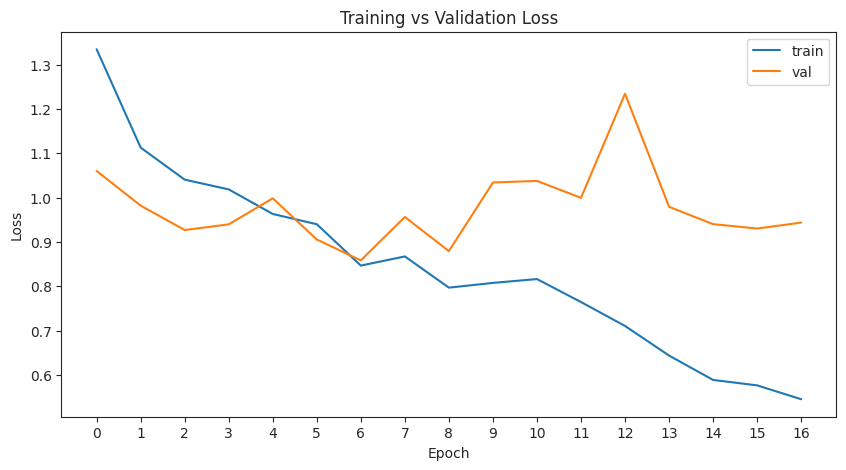

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.5 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 1.0580


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.05412 (best 1.05412), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.05.ckpt' as top 1


Average validation loss for epoch 0: 1.0534
Average training loss for epoch 0: 1.2650


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' was not in top 1


Average validation loss for epoch 1: 1.0615
Average training loss for epoch 1: 1.1474


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.0522
Average training loss for epoch 2: 1.0652


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' was not in top 1


Average validation loss for epoch 3: 1.0653
Average training loss for epoch 3: 1.0749


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' was not in top 1


Average validation loss for epoch 4: 1.1008
Average training loss for epoch 4: 0.9824


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' was not in top 1


Average validation loss for epoch 5: 1.1079
Average training loss for epoch 5: 0.9879


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' was not in top 1


Average validation loss for epoch 6: 1.2925
Average training loss for epoch 6: 0.9666


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' reached 0.99031 (best 0.99031), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=7-val_loss=0.99.ckpt' as top 1


Average validation loss for epoch 7: 0.9741
Average training loss for epoch 7: 0.8886


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' reached 0.97601 (best 0.97601), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=8-val_loss=0.98.ckpt' as top 1


Average validation loss for epoch 8: 0.9597
Average training loss for epoch 8: 0.8536


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' reached 0.97088 (best 0.97088), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=9-val_loss=0.97.ckpt' as top 1


Average validation loss for epoch 9: 0.9563
Average training loss for epoch 9: 0.8139


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9629
Average training loss for epoch 10: 0.7777


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9570
Average training loss for epoch 11: 0.7997


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.9588
Average training loss for epoch 12: 0.7543


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.9657
Average training loss for epoch 13: 0.7373


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.9743
Average training loss for epoch 14: 0.7464


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.9777
Average training loss for epoch 15: 0.7351


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 306: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.9784
Average training loss for epoch 16: 0.7174


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 324: 'val_loss' was not in top 1


Average validation loss for epoch 17: 0.9793
Average training loss for epoch 17: 0.7059


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 342: 'val_loss' was not in top 1


Average validation loss for epoch 18: 0.9753
Average training loss for epoch 18: 0.6757


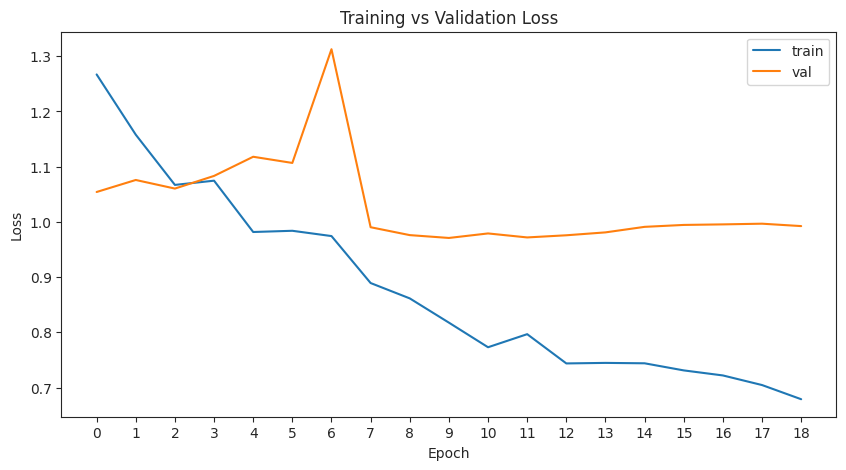

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
9.4 K     Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.7678


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 0.82917 (best 0.82917), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=0.83.ckpt' as top 1


Average validation loss for epoch 0: 0.8141
Average training loss for epoch 0: 1.0596


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 0.81248 (best 0.81248), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.81.ckpt' as top 1


Average validation loss for epoch 1: 0.8068
Average training loss for epoch 1: 0.9990


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' was not in top 1


Average validation loss for epoch 2: 0.8630
Average training loss for epoch 2: 0.9410


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' was not in top 1


Average validation loss for epoch 3: 0.8315
Average training loss for epoch 3: 0.8962


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' was not in top 1


Average validation loss for epoch 4: 0.8442
Average training loss for epoch 4: 0.8234


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' reached 0.80142 (best 0.80142), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=0.80.ckpt' as top 1


Average validation loss for epoch 5: 0.7986
Average training loss for epoch 5: 0.8450


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' was not in top 1


Average validation loss for epoch 6: 0.9859
Average training loss for epoch 6: 0.8339


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' was not in top 1


Average validation loss for epoch 7: 0.8800
Average training loss for epoch 7: 0.7982


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.8488
Average training loss for epoch 8: 0.7634


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9004
Average training loss for epoch 9: 0.7123


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 1.1492
Average training loss for epoch 10: 0.7633


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9133
Average training loss for epoch 11: 0.7298


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 0.8573
Average training loss for epoch 12: 0.6300


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' was not in top 1


Average validation loss for epoch 13: 0.8677
Average training loss for epoch 13: 0.6057


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' was not in top 1


Average validation loss for epoch 14: 0.8432
Average training loss for epoch 14: 0.5924


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.8459
Average training loss for epoch 15: 0.5548


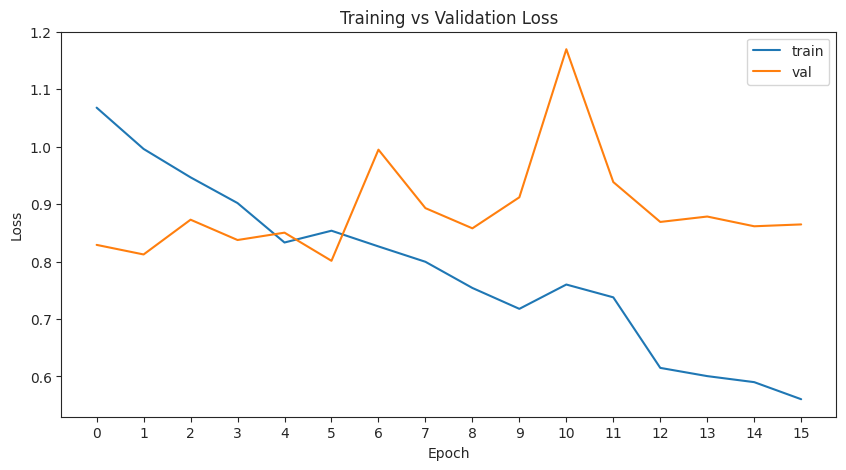

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:751: Checkpoint directory /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type   | Params | Mode 
-----------------------------------------
0 | model | ResNet | 11.2 M | train
-----------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.716    Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |                                        | 0/? [00:00<?, ?it/s]

Average validation loss for epoch 0: 0.9761


/home/alumno/py313ml/.venv/lib/python3.13/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |                                               | 0/? [00:00<?, ?it/s]

Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 0, global step 18: 'val_loss' reached 1.02380 (best 1.02380), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=0-val_loss=1.02.ckpt' as top 1


Average validation loss for epoch 0: 1.0152
Average training loss for epoch 0: 1.1667


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 1, global step 36: 'val_loss' reached 0.91910 (best 0.91910), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=1-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 1: 0.9324
Average training loss for epoch 1: 1.0665


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 2, global step 54: 'val_loss' was not in top 1


Average validation loss for epoch 2: 1.0009
Average training loss for epoch 2: 1.0000


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 3, global step 72: 'val_loss' reached 0.91797 (best 0.91797), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=3-val_loss=0.92.ckpt' as top 1


Average validation loss for epoch 3: 0.9224
Average training loss for epoch 3: 0.9967


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 4, global step 90: 'val_loss' reached 0.90619 (best 0.90619), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=4-val_loss=0.91.ckpt' as top 1


Average validation loss for epoch 4: 0.9126
Average training loss for epoch 4: 0.8933


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 5, global step 108: 'val_loss' reached 0.85647 (best 0.85647), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=5-val_loss=0.86.ckpt' as top 1


Average validation loss for epoch 5: 0.8579
Average training loss for epoch 5: 0.8798


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 6, global step 126: 'val_loss' reached 0.82762 (best 0.82762), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=6-val_loss=0.83.ckpt' as top 1


Average validation loss for epoch 6: 0.8312
Average training loss for epoch 6: 0.8718


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 7, global step 144: 'val_loss' was not in top 1


Average validation loss for epoch 7: 1.0342
Average training loss for epoch 7: 0.8696


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 8, global step 162: 'val_loss' was not in top 1


Average validation loss for epoch 8: 0.9255
Average training loss for epoch 8: 0.8195


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 9, global step 180: 'val_loss' was not in top 1


Average validation loss for epoch 9: 0.9318
Average training loss for epoch 9: 0.8612


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 10, global step 198: 'val_loss' was not in top 1


Average validation loss for epoch 10: 0.9237
Average training loss for epoch 10: 0.7501


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 11, global step 216: 'val_loss' was not in top 1


Average validation loss for epoch 11: 0.9867
Average training loss for epoch 11: 0.7514


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 12, global step 234: 'val_loss' was not in top 1


Average validation loss for epoch 12: 1.0576
Average training loss for epoch 12: 0.7406


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 13, global step 252: 'val_loss' reached 0.82645 (best 0.82645), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=13-val_loss=0.83.ckpt' as top 1


Average validation loss for epoch 13: 0.8312
Average training loss for epoch 13: 0.6784


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 14, global step 270: 'val_loss' reached 0.78763 (best 0.78763), saving model to '/home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/checkpoints/cassava_resnet18_geo_photo_aug_dropout_epoch=14-val_loss=0.79.ckpt' as top 1


Average validation loss for epoch 14: 0.7913
Average training loss for epoch 14: 0.6643


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 15, global step 288: 'val_loss' was not in top 1


Average validation loss for epoch 15: 0.7981
Average training loss for epoch 15: 0.5916


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 16, global step 306: 'val_loss' was not in top 1


Average validation loss for epoch 16: 0.8059
Average training loss for epoch 16: 0.5893


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 17, global step 324: 'val_loss' was not in top 1


Average validation loss for epoch 17: 0.8138
Average training loss for epoch 17: 0.5682


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 18, global step 342: 'val_loss' was not in top 1


Average validation loss for epoch 18: 0.8491
Average training loss for epoch 18: 0.5322


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 19, global step 360: 'val_loss' was not in top 1


Average validation loss for epoch 19: 0.8871
Average training loss for epoch 19: 0.5695


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 20, global step 378: 'val_loss' was not in top 1


Average validation loss for epoch 20: 0.8644
Average training loss for epoch 20: 0.5567


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 21, global step 396: 'val_loss' was not in top 1


Average validation loss for epoch 21: 0.8814
Average training loss for epoch 21: 0.5761


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 22, global step 414: 'val_loss' was not in top 1


Average validation loss for epoch 22: 0.8682
Average training loss for epoch 22: 0.5232


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 23, global step 432: 'val_loss' was not in top 1


Average validation loss for epoch 23: 0.8840
Average training loss for epoch 23: 0.5428


Validation: |                                             | 0/? [00:00<?, ?it/s]

Epoch 24, global step 450: 'val_loss' was not in top 1


Average validation loss for epoch 24: 0.8795
Average training loss for epoch 24: 0.5225


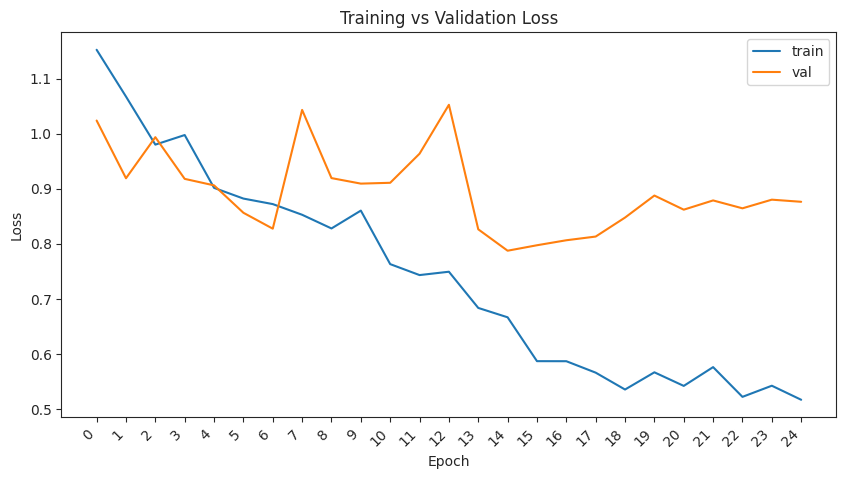

In [19]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')
last_checkpoint = None

data_module = DataModule(num_subsets=len(freeze_until_idx), transforms=data_transforms)

for iteration, unfreezing_idx in enumerate(freeze_until_idx):
    # Setup each subset
    data_module.subset_idx = iteration 
    data_module.setup()

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_geo_photo_aug_dropout_subsets_for_tr_and_val"

    # Freeze all layers
    for idx_param, param in enumerate(model.parameters()):
        if idx_param < unfreezing_idx:
            param.requires_grad = False
        else:
            param.requires_grad = True

    # Wrap the model inside a LightningModule. 
    # For the baseline, we will keep the learning rate and weight decay at their default values.
    if iteration == 0:

        # Aplicar a todos los bloques
        for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
            layer = getattr(model, layer_name)
            for block in layer:
                add_dropout_to_basicblock(block, p=0.2)
        
        # Cambiar última capa
        num_in_feat = model.fc.in_features
        model.fc = nn.Linear(num_in_feat, NUM_CLASSES)
        lightning_module = LightningModule(model, lr=1e-3)
        #lightning_module = LightningModule(model, discriminative_lr=(1e-3, 0.1))
    else:
        lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_geo_photo_aug_dropout_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )

    last_checkpoint = model_checkpointing.best_model_path

### CM

Generating predictions...
F1 Score (macro): 0.6220
Confusion matrix saved to /home/alumno/Desktop/datos/COMPUTER_VISION/ASSIGNMENT_2/cassava/figures/cassava_resnet18_gradual_unfreezing_geo_photo_aug_dropout_trainval_subsets_CM.pdf


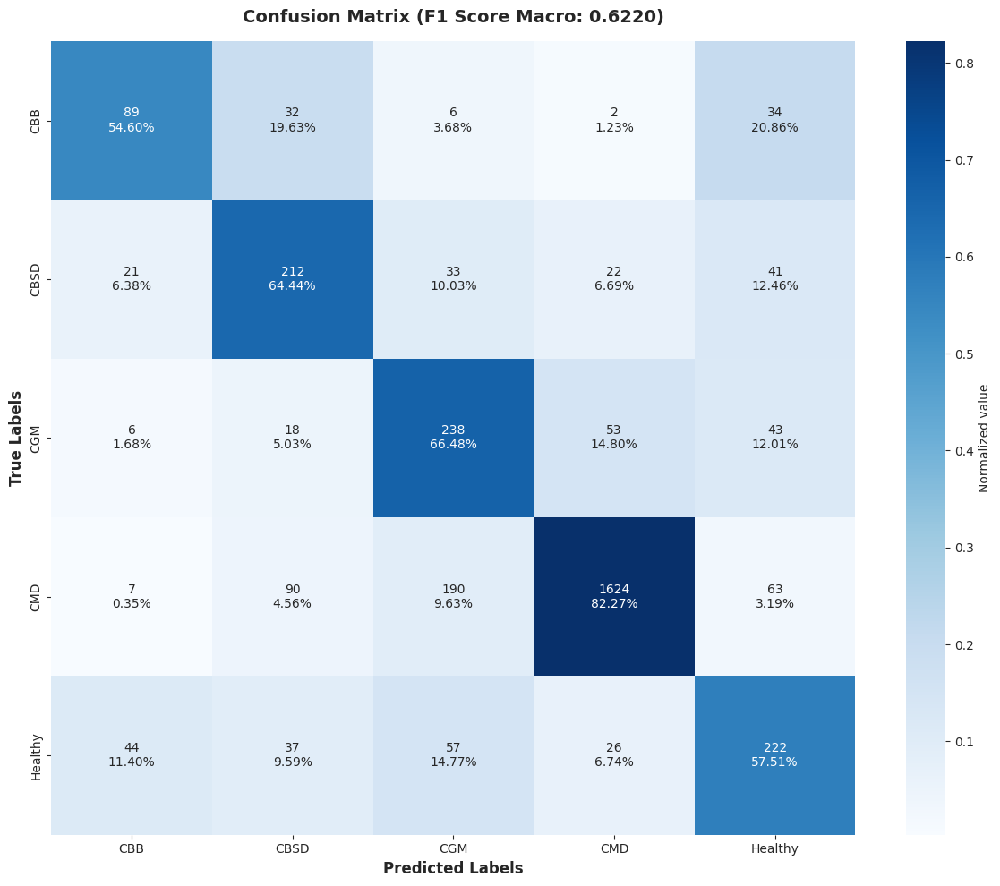

In [20]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_geo_photo_aug_dropout_trainval_subsets_CM.pdf')
)

## Experiment 4: Fixed train of Best (Geo + Photo with Dropout)
As Christian said, it is important to use the same image size of the original pretrained network (we were using 256x256 size instead of 224x224)
Moreover, there was a implementation error when loading the checkpoint on the gradual unfreezing method.
In this experiment, we take the best result obtained for the moment and we apply all these corrections.

### Variables Setup

In [ ]:
prob = {
    'horizontal_flip': 0.1,
    'vertical_flip': 0.1,
    'resized_crop': 0.2,
    'rotation': 0.2,
    'affine_trans': 0.2,
    'color_jitter': 0.5,
    'gauss_blur': 0.1,
    'gauss_noise': 0.1,
}
data_transforms = {
    'train': T.Compose([
        T.Resize(size=256, interpolation=InterpolationMode.BILINEAR),
        T.RandomApply([T.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.025)], p=prob['color_jitter']),
        T.RandomApply([T.GaussianBlur(kernel_size=(3,3), sigma=(0.1, 2.0))], p=prob['gauss_blur']),
        T.RandomHorizontalFlip(p=prob['horizontal_flip']),
        T.RandomVerticalFlip(p=prob['vertical_flip']),
        T.RandomApply([T.RandomResizedCrop(size=256, scale=(0.5, 1.0), ratio=(0.75, 1.33))], p=prob['resized_crop']),
        T.RandomApply([T.RandomRotation(degrees=(-90, 90))], p=prob['rotation']),
        T.RandomApply([T.RandomAffine(degrees=(0, 0), translate=(0.25, 0.25))], p=prob['affine_trans']),
        T.CenterCrop(224), # <- Size fixed!!
        T.ToTensor(),
        T.RandomApply([GaussianNoise()], p=prob['gauss_noise']),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': ResNet18_Weights.IMAGENET1K_V1.transforms(),
    'test': ResNet18_Weights.IMAGENET1K_V1.transforms()
}

### Trainig Loop

In [ ]:
save_dir = f"{os.getcwd()}/cassava_logs"
max_epochs = 100

# Set random seed for reproducibility
pl.seed_everything(seed=42, workers=True)

# Instantiate the model, freeze all layers and adapt the first layer
model = models.resnet18(weights='IMAGENET1K_V1')

# Aplicar a todos los bloques
for layer_name in ['layer1', 'layer2', 'layer3', 'layer4']:
    layer = getattr(model, layer_name)
    for block in layer:
        add_dropout_to_basicblock(block, p=0.2)

# Freeze layers
for idx_param, param in enumerate(model.parameters()):
    param.requires_grad = False

# Cambiar última capa
num_in_feat = model.fc.in_features
model.fc = nn.Linear(num_in_feat, NUM_CLASSES)

lightning_module = LightningModule(model, lr=1e-3)

data_module = DataModule(num_subsets=1, transforms=data_transforms)
data_module.setup()
for iteration, unfreezing_idx in enumerate(freeze_until_idx):

    log_name = f"cassava_resnet18_gradual_unfreezing_step_{iteration}_geo_photo_aug_dropout_fixed"

    # Wrap the model inside a LightningModule. 
    if iteration > 0:
        
        # FIX
        checkpoint = torch.load(model_checkpointing.best_model_path, map_location='cpu')
        state_dict = OrderedDict({k.replace('model.', ''):v for k,v in checkpoint['state_dict'].items()}) # Extract weights from Lightning 'model.conv1.weight' -> 'conv1.weight
        
        lightning_module.model.load_state_dict(state_dict)

        # Freeze layers
        for idx_param, param in enumerate(lightning_module.model.parameters()):
            if idx_param < unfreezing_idx:
                param.requires_grad = False
            else:
                param.requires_grad = True
        
        #lightning_module.lr = 1e-5
        
        # Get the optimizer list from your LightningModule
        optimizer = lightning_module.optimizers()
        
        # Load the first optimizer state
        optimizer.load_state_dict(checkpoint['optimizer_states'][0])
        
        """for param_group in optimizer.param_groups:
            param_group['lr'] = 1e-5"""
        
        # OLD
        #lightning_module = LightningModule.load_from_checkpoint(last_checkpoint, model=model)
        
    # Define a CSV logger to store training/validation metrics in CSV format.
    csv_logger = CSVLogger(save_dir=save_dir, name=log_name)

    # Define callbacks
    learning_rate_monitor = pl.callbacks.LearningRateMonitor(logging_interval='epoch')
    early_stop_callback = EarlyStopping(
        monitor="val_loss",
        min_delta=0.01,
        patience=10,
        verbose=False,
        mode="min"
    )
    model_checkpointing = ModelCheckpoint(
        dirpath=os.path.join(os.getcwd(), "checkpoints"),
        filename='cassava_resnet18_geo_photo_aug_dropout_fixed_{epoch}-{val_loss:.2f}',
        monitor='val_loss',
        verbose=True,
        save_last=False,
        mode='min'
    )

    trainer = pl.Trainer(
        max_epochs=max_epochs,
        logger=[csv_logger],
        callbacks=[
            learning_rate_monitor,
            early_stop_callback,
            model_checkpointing
        ]
    )

    # Train the model with the trainer, passing the core LightningModule and data module.
    trainer.fit(lightning_module, data_module)

    plot_loss_curves(
        trainer,
        filename=os.path.join(os.getcwd(), 'figures', f'{log_name}_losses.pdf')
    )


### CM

In [ ]:
plot_cm(
    trainer,
    data_module,
    filename=os.path.join(os.getcwd(), 'figures', 'cassava_resnet18_gradual_unfreezing_geo_photo_aug_dropout_fixed_CM.pdf')
)

## TTA

### Functions

In [4]:
def evaluate_with_tta(model, data_module, tta_transforms=None, device=None):
    """
    Evaluate model with Test-Time Augmentation.
    
    Parameters:
    -----------
    model : pytorch_lightning.LightningModule
        The trained model
    data_module : pytorch_lightning.LightningDataModule
        The data module containing test data
    tta_transforms : ttach.Compose, optional
        TTA transforms to apply. If None, uses default transforms.
    device : torch.device, optional
        Device to use. If None, uses cuda if available.
        
    Returns:
    --------
    tuple
        (y_true, y_pred_tta, accuracy, f1_score)
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Set model to evaluation mode
    model.to(device)
    model.eval()
    
    # Define default TTA transforms if not provided
    if tta_transforms is None:
        tta_transforms = tta.Compose([
            tta.HorizontalFlip(),
            tta.VerticalFlip(),
            tta.Rotate90(angles=[0, 90, 180, 270]),
            tta.Scale(scales=[0.9, 1.0, 1.1]),
            tta.Multiply(factors=[0.9, 1.0, 1.1])
        ])
    
    # Wrap model with TTA
    tta_model = tta.ClassificationTTAWrapper(model.model, tta_transforms, merge_mode='mean')
    
    y_trues = []
    y_preds = []
    
    print("Generating predictions with TTA...")
    with torch.no_grad():
        for x, y_true in tqdm(data_module.test_dataloader(), desc="TTA Inference"):
            x = x.to(device)
            
            # Get TTA predictions
            logits = tta_model(x)
            preds = logits.argmax(dim=1).cpu()
            
            y_preds.append(preds)
            y_trues.append(y_true.cpu())
    
    # Concatenate results
    y_trues = torch.cat(y_trues).numpy()
    y_preds = torch.cat(y_preds).numpy()
    
    # Calculate metrics
    accuracy = accuracy_score(y_trues, y_preds)
    f1 = f1_score(y_trues, y_preds, average='macro')
    
    print(f'\nTTA Results:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'F1 Score (macro): {f1:.4f}')
    
    return y_trues, y_preds, accuracy, f1


def plot_tta_confusion_matrix(y_true, y_pred, f1, filename=None):
    """
    Plot confusion matrix for TTA predictions.
    
    Parameters:
    -----------
    y_true : numpy.ndarray
        True labels
    y_pred : numpy.ndarray
        Predicted labels from TTA
    f1 : float
        F1 score
    filename : str, optional
        If provided, saves the plot to this filename
    """
    # Load label mapping
    label_map_path = os.path.join(DATASET_PATH, 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)
    
    class_labels = []
    for label in range(len(label_map)):
        disease_name = label_map[str(label)]
        if 'Healthy' in disease_name:
            abbrev = 'Healthy'
        else:
            abbrev = disease_name[disease_name.find('(')+1:disease_name.find(')')]
        class_labels.append(abbrev)
    
    # Build confusion matrix
    num_classes = len(class_labels)
    labels = np.arange(num_classes)
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    
    # Normalize by row
    with np.errstate(all='ignore'):
        row_sums = cm.sum(axis=1, keepdims=True)
        cm_row_norm = np.divide(cm.astype(float), row_sums, where=row_sums != 0)
        cm_row_norm = np.nan_to_num(cm_row_norm)
    
    # Create annotations
    nrows, ncols = cm.shape
    annot = np.empty((nrows, ncols), dtype=object)
    for i in range(nrows):
        for j in range(ncols):
            annot[i, j] = f"{cm[i, j]}\\n{cm_row_norm[i, j]*100:.2f}%"
    
    # Plot
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_row_norm, annot=annot, fmt='', cmap='Blues', cbar=True,
                xticklabels=class_labels, yticklabels=class_labels,
                cbar_kws={'label': 'Normalized value'})
    
    plt.title(f"TTA Confusion Matrix (F1 Score Macro: {f1:.4f})", 
              fontsize=14, fontweight='bold', pad=15)
    plt.xlabel("Predicted Labels", fontsize=12, fontweight='bold')
    plt.ylabel("True Labels", fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    
    if filename is not None:
        plt.savefig(filename, dpi=80)
        print(f"TTA confusion matrix saved to {filename}")
    
    plt.show()


def compare_with_and_without_tta(trainer, data_module, tta_transforms=None):
    """
    Compare model performance with and without TTA.
    
    Parameters:
    -----------
    trainer : pytorch_lightning.Trainer
        The trained PyTorch Lightning trainer object
    data_module : pytorch_lightning.LightningDataModule
        The data module containing test data
    tta_transforms : ttach.Compose, optional
        TTA transforms to apply
    """
    model = trainer.lightning_module
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # 1. Evaluate WITHOUT TTA (standard inference)
    print("="*50)
    print("STANDARD INFERENCE (No TTA)")
    print("="*50)
    model.to(device)
    model.eval()
    
    y_trues_no_tta = []
    y_preds_no_tta = []
    
    with torch.no_grad():
        for x, y_true in tqdm(data_module.test_dataloader(), desc="Standard Inference"):
            x = x.to(device)
            logits = model(x)
            preds = logits.softmax(dim=1).argmax(dim=1).cpu()
            
            y_preds_no_tta.append(preds)
            y_trues_no_tta.append(y_true.cpu())
    
    y_trues_no_tta = torch.cat(y_trues_no_tta).numpy()
    y_preds_no_tta = torch.cat(y_preds_no_tta).numpy()
    
    acc_no_tta = accuracy_score(y_trues_no_tta, y_preds_no_tta)
    f1_no_tta = f1_score(y_trues_no_tta, y_preds_no_tta, average='macro')
    
    print(f'Accuracy (No TTA): {acc_no_tta:.4f}')
    print(f'F1 Score (No TTA): {f1_no_tta:.4f}')
    
    # 2. Evaluate WITH TTA
    print("\n" + "="*50)
    print("TEST-TIME AUGMENTATION (TTA)")
    print("="*50)
    y_trues_tta, y_preds_tta, acc_tta, f1_tta = evaluate_with_tta(
        model, data_module, tta_transforms, device
    )
    
    # 3. Compare results
    print("\n" + "="*50)
    print("COMPARISON")
    print("="*50)
    print(f"Accuracy improvement: {(acc_tta - acc_no_tta)*100:+.2f}%")
    print(f"F1 Score improvement: {(f1_tta - f1_no_tta)*100:+.2f}%")
    
    # 4. Plot both confusion matrices side by side
    fig, axes = plt.subplots(1, 2, figsize=(24, 10))
    
    # Load label mapping
    label_map_path = os.path.join(DATASET_PATH, 'label_num_to_disease_map.json')
    with open(label_map_path, 'r') as f:
        label_map = json.load(f)
    
    class_labels = []
    for label in range(len(label_map)):
        disease_name = label_map[str(label)]
        if 'Healthy' in disease_name:
            abbrev = 'Healthy'
        else:
            abbrev = disease_name[disease_name.find('(')+1:disease_name.find(')')]
        class_labels.append(abbrev)
    
    # Plot No TTA
    num_classes = len(class_labels)
    labels = np.arange(num_classes)
    cm_no_tta = confusion_matrix(y_trues_no_tta, y_preds_no_tta, labels=labels)
    
    with np.errstate(all='ignore'):
        row_sums = cm_no_tta.sum(axis=1, keepdims=True)
        cm_no_tta_norm = np.divide(cm_no_tta.astype(float), row_sums, where=row_sums != 0)
        cm_no_tta_norm = np.nan_to_num(cm_no_tta_norm)
    
    annot_no_tta = np.empty((num_classes, num_classes), dtype=object)
    for i in range(num_classes):
        for j in range(num_classes):
            annot_no_tta[i, j] = f"{cm_no_tta[i, j]}\\n{cm_no_tta_norm[i, j]*100:.2f}%"
    
    sns.heatmap(cm_no_tta_norm, annot=annot_no_tta, fmt='', cmap='Blues', 
                cbar=True, ax=axes[0], xticklabels=class_labels, 
                yticklabels=class_labels, cbar_kws={'label': 'Normalized value'})
    axes[0].set_title(f"No TTA (F1: {f1_no_tta:.4f})", fontsize=14, fontweight='bold')
    axes[0].set_xlabel("Predicted Labels", fontsize=12, fontweight='bold')
    axes[0].set_ylabel("True Labels", fontsize=12, fontweight='bold')
    
    # Plot TTA
    cm_tta = confusion_matrix(y_trues_tta, y_preds_tta, labels=labels)
    
    with np.errstate(all='ignore'):
        row_sums = cm_tta.sum(axis=1, keepdims=True)
        cm_tta_norm = np.divide(cm_tta.astype(float), row_sums, where=row_sums != 0)
        cm_tta_norm = np.nan_to_num(cm_tta_norm)
    
    annot_tta = np.empty((num_classes, num_classes), dtype=object)
    for i in range(num_classes):
        for j in range(num_classes):
            annot_tta[i, j] = f"{cm_tta[i, j]}\\n{cm_tta_norm[i, j]*100:.2f}%"
    
    sns.heatmap(cm_tta_norm, annot=annot_tta, fmt='', cmap='Greens', 
                cbar=True, ax=axes[1], xticklabels=class_labels, 
                yticklabels=class_labels, cbar_kws={'label': 'Normalized value'})
    axes[1].set_title(f"With TTA (F1: {f1_tta:.4f})", fontsize=14, fontweight='bold')
    axes[1].set_xlabel("Predicted Labels", fontsize=12, fontweight='bold')
    axes[1].set_ylabel("True Labels", fontsize=12, fontweight='bold')
    
    plt.suptitle(f"Comparison: Standard vs TTA Inference\\n"
                 f"Accuracy: {acc_no_tta:.4f} → {acc_tta:.4f} ({(acc_tta-acc_no_tta)*100:+.2f}%) | "
                 f"F1 Score: {f1_no_tta:.4f} → {f1_tta:.4f} ({(f1_tta-f1_no_tta)*100:+.2f}%)",
                 fontsize=16, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()
    
    return {
        'no_tta': {'accuracy': acc_no_tta, 'f1': f1_no_tta},
        'with_tta': {'accuracy': acc_tta, 'f1': f1_tta}
    }

### Prediction

In [ ]:
# ============================================
# TTA EXPERIMENT
# ============================================

# Assuming you have already trained a model and have:
# - trainer: your trained PyTorch Lightning trainer
# - data_module: your data module

# Define custom TTA transforms (optional)
custom_tta_transforms = tta.Compose([
    tta.HorizontalFlip(),
    tta.VerticalFlip(),
    tta.Rotate90(angles=[0, 90, 180, 270]),
    tta.Scale(scales=[0.95, 1.0, 1.05]),
    tta.Multiply(factors=[0.95, 1.0, 1.05])
])

# Option 1: Just evaluate with TTA
print("Evaluating with TTA...")
y_true, y_pred, accuracy, f1 = evaluate_with_tta(
    trainer.lightning_module, 
    data_module,
    tta_transforms=custom_tta_transforms
)

# Plot TTA confusion matrix
plot_tta_confusion_matrix(y_true, y_pred, f1, filename='figures/tta_confusion_matrix.png')

# Option 2: Compare with and without TTA (recommended)
print("\nComparing Standard Inference vs TTA...")
results = compare_with_and_without_tta(
    trainer, 
    data_module, 
    tta_transforms=custom_tta_transforms
)

print("\n" + "="*50)
print("FINAL RESULTS SUMMARY")
print("="*50)
print(f"Without TTA - Accuracy: {results['no_tta']['accuracy']:.4f}, F1: {results['no_tta']['f1']:.4f}")
print(f"With TTA    - Accuracy: {results['with_tta']['accuracy']:.4f}, F1: {results['with_tta']['f1']:.4f}")
print(f"Improvement - Accuracy: {(results['with_tta']['accuracy'] - results['no_tta']['accuracy'])*100:+.2f}%, "
      f"F1: {(results['with_tta']['f1'] - results['no_tta']['f1'])*100:+.2f}%")

# End of Notebook (Shortcut)